### **FUNCTIONS IMPORTATION**

In [1]:
import pandas as pd
import numpy as np
import time
import os
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import matplotlib.dates as mdates
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import scipy.signal
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.metrics import mean_squared_error, mean_absolute_error
import warnings
import statsmodels.api as sm
import scipy.stats as stats
from statsmodels.tsa.statespace.varmax import VARMAX

### **DATASET IMPORTATION FROM DRIVE**

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
dataset_path = "/content/drive/MyDrive/Data"

In [4]:
#list of folder in datase_path
folder_list = os.listdir(dataset_path)

In [5]:
# get all the filename from folder_list
file_list = []
for folder in folder_list:
    if not os.path.isdir(os.path.join(dataset_path, folder)):
        continue
    file_list.append(list(map(lambda x: os.path.join(folder, x), os.listdir(os.path.join(dataset_path, folder)))))

In [6]:
file_list

[['Finland/finland_2020.csv',
  'Finland/finland_2021.csv',
  'Finland/finland_2022.csv',
  'Finland/finland_2023.csv',
  'Finland/finland_2024.csv'],
 ['Spain/spain_2020.csv',
  'Spain/spain_2021.csv',
  'Spain/spain_2022.csv',
  'Spain/spain_2023.csv',
  'Spain/spain_2024.csv'],
 ['Germany/germany_2020.csv',
  'Germany/germany_2021.csv',
  'Germany/germany_2022.csv',
  'Germany/germany_2023.csv',
  'Germany/germany_2024.csv'],
 ['Netherland/netherland_2020.csv',
  'Netherland/netherland_2021.csv',
  'Netherland/netherland_2022.csv',
  'Netherland/netherland_2023.csv',
  'Netherland/netherland_2024.csv']]

In [7]:
#load all file in file list into on csv
all_df = []
for folder_file in file_list:
  df = pd.DataFrame()
  for file in folder_file:
      df = pd.concat([df, pd.read_csv(os.path.join(dataset_path, file))])
  all_df.append(df)

print(file_list)

[['Finland/finland_2020.csv', 'Finland/finland_2021.csv', 'Finland/finland_2022.csv', 'Finland/finland_2023.csv', 'Finland/finland_2024.csv'], ['Spain/spain_2020.csv', 'Spain/spain_2021.csv', 'Spain/spain_2022.csv', 'Spain/spain_2023.csv', 'Spain/spain_2024.csv'], ['Germany/germany_2020.csv', 'Germany/germany_2021.csv', 'Germany/germany_2022.csv', 'Germany/germany_2023.csv', 'Germany/germany_2024.csv'], ['Netherland/netherland_2020.csv', 'Netherland/netherland_2021.csv', 'Netherland/netherland_2022.csv', 'Netherland/netherland_2023.csv', 'Netherland/netherland_2024.csv']]


In [8]:
finland_df, spain_df, germany_df, netherlands_df = all_df

### ***DATASET CONVERSION FROM MINUTE TO A DAY DATA***

In [9]:
def convert_to_datetime(df):
  df['start_time'] = df['MTU'].str.split(" - ").str[0]
  df = df.drop('MTU', axis=1)
  df['start_time'] = pd.to_datetime(df['start_time'], format="%d.%m.%Y %H:%M")
  df.set_index('start_time', inplace=True)
  return df

In [10]:
finland_df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 86405 entries, 0 to 35139
Data columns (total 24 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   Area                                                      86405 non-null  object 
 1   MTU                                                       86405 non-null  object 
 2   Biomass - Actual Aggregated [MW]                          86397 non-null  float64
 3   Energy storage - Actual Aggregated [MW]                   86397 non-null  object 
 4   Fossil Brown coal/Lignite - Actual Aggregated [MW]        86397 non-null  object 
 5   Fossil Coal-derived gas - Actual Aggregated [MW]          86397 non-null  object 
 6   Fossil Gas - Actual Aggregated [MW]                       86397 non-null  float64
 7   Fossil Hard coal - Actual Aggregated [MW]                 86397 non-null  float64
 8   Fossil Oil - Actual A

In [11]:
finland_df.columns

Index(['Area', 'MTU', 'Biomass - Actual Aggregated [MW]',
       'Energy storage - Actual Aggregated [MW]',
       'Fossil Brown coal/Lignite - Actual Aggregated [MW]',
       'Fossil Coal-derived gas - Actual Aggregated [MW]',
       'Fossil Gas - Actual Aggregated [MW]',
       'Fossil Hard coal - Actual Aggregated [MW]',
       'Fossil Oil - Actual Aggregated [MW]',
       'Fossil Oil shale - Actual Aggregated [MW]',
       'Fossil Peat - Actual Aggregated [MW]',
       'Geothermal - Actual Aggregated [MW]',
       'Hydro Pumped Storage - Actual Aggregated [MW]',
       'Hydro Pumped Storage - Actual Consumption [MW]',
       'Hydro Run-of-river and poundage - Actual Aggregated [MW]',
       'Hydro Water Reservoir - Actual Aggregated [MW]',
       'Marine - Actual Aggregated [MW]', 'Nuclear - Actual Aggregated [MW]',
       'Other - Actual Aggregated [MW]',
       'Other renewable - Actual Aggregated [MW]',
       'Solar - Actual Aggregated [MW]', 'Waste - Actual Aggregated [MW]',
 

### **SUBSETTING AND CLEANING THE REQUIRED FOUR ENERGY SOURCE FROM THE WHOLE DATASET.**

In [12]:
# select the desired columns for each dataframe before converting to datetime
finland_df = finland_df[['MTU','Fossil Gas - Actual Aggregated [MW]', 'Fossil Hard coal - Actual Aggregated [MW]', 'Solar - Actual Aggregated [MW]', 'Wind Onshore - Actual Aggregated [MW]']]
finland_df.replace("n/e", np.nan, inplace=True)
finland_df.fillna(0, inplace=True)
# Convert relevant columns to numeric
for col in ['Fossil Gas - Actual Aggregated [MW]', 'Fossil Hard coal - Actual Aggregated [MW]', 'Solar - Actual Aggregated [MW]', 'Wind Onshore - Actual Aggregated [MW]']:
    finland_df[col] = finland_df[col].astype(float)
finland_df = convert_to_datetime(finland_df)

germany_df = germany_df[['MTU','Fossil Gas - Actual Aggregated [MW]', 'Fossil Hard coal - Actual Aggregated [MW]', 'Solar - Actual Aggregated [MW]', 'Wind Onshore - Actual Aggregated [MW]']]
germany_df.replace("n/e", np.nan, inplace=True)
germany_df.fillna(0, inplace=True)
for col in ['Fossil Gas - Actual Aggregated [MW]', 'Fossil Hard coal - Actual Aggregated [MW]', 'Solar - Actual Aggregated [MW]', 'Wind Onshore - Actual Aggregated [MW]']:
    germany_df[col] = germany_df[col].astype(float)
germany_df = convert_to_datetime(germany_df)

netherlands_df = netherlands_df[['MTU','Fossil Gas - Actual Aggregated [MW]', 'Fossil Hard coal - Actual Aggregated [MW]', 'Solar - Actual Aggregated [MW]', 'Wind Onshore - Actual Aggregated [MW]']]
netherlands_df.replace("n/e", np.nan, inplace=True)
netherlands_df.fillna(0, inplace=True)
for col in ['Fossil Gas - Actual Aggregated [MW]', 'Fossil Hard coal - Actual Aggregated [MW]', 'Solar - Actual Aggregated [MW]', 'Wind Onshore - Actual Aggregated [MW]']:
    netherlands_df[col] = netherlands_df[col].astype(float)
netherlands_df = convert_to_datetime(netherlands_df)


spain_df = spain_df[['MTU','Fossil Gas - Actual Aggregated [MW]', 'Fossil Hard coal - Actual Aggregated [MW]', 'Solar - Actual Aggregated [MW]', 'Wind Onshore - Actual Aggregated [MW]']]
spain_df.replace("n/e", np.nan, inplace=True)
spain_df.fillna(0, inplace=True)
for col in ['Fossil Gas - Actual Aggregated [MW]', 'Fossil Hard coal - Actual Aggregated [MW]', 'Solar - Actual Aggregated [MW]', 'Wind Onshore - Actual Aggregated [MW]']:
    spain_df[col] = spain_df[col].astype(float)
spain_df = convert_to_datetime(spain_df)

<ipython-input-12-3620314308>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  finland_df.replace("n/e", np.nan, inplace=True)
<ipython-input-12-3620314308>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  finland_df.fillna(0, inplace=True)
<ipython-input-12-3620314308>:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  finland_df[col] = finland_df[col].astype(float)
<ipython-input

### **VISUALIZATION OF DATA TO BE SURE OF NO MISSING VALUES**

<Axes: ylabel='start_time'>

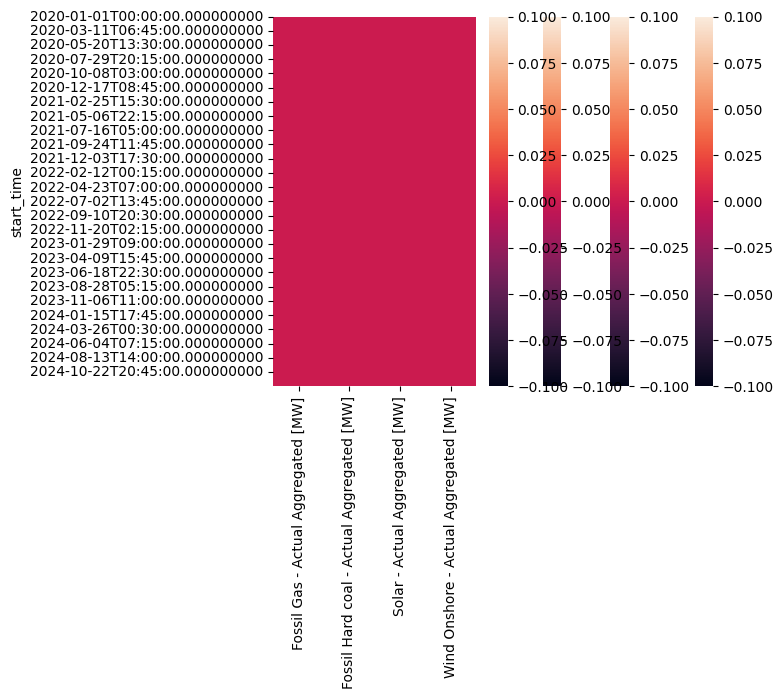

In [13]:
#plot na on heatmap
sns.heatmap(finland_df.isna())
sns.heatmap(germany_df.isna())
sns.heatmap(spain_df.isna())
sns.heatmap(netherlands_df.isna())

### **AGGREGATING MY DATA INTO DAILY DATA FUNCTION**

In [14]:
def aggregete_daily_data(df):
  return df.resample('D').mean()

### **AGGREGATING THE DATASET**

In [15]:
finland_daily_mean = aggregete_daily_data(finland_df)
germany_daily_mean = aggregete_daily_data(germany_df)
netherlands_daily_mean = aggregete_daily_data(netherlands_df)
spain_daily_mean = aggregete_daily_data(spain_df)

### **PLOTTING THE AGGREGATED DATASET**

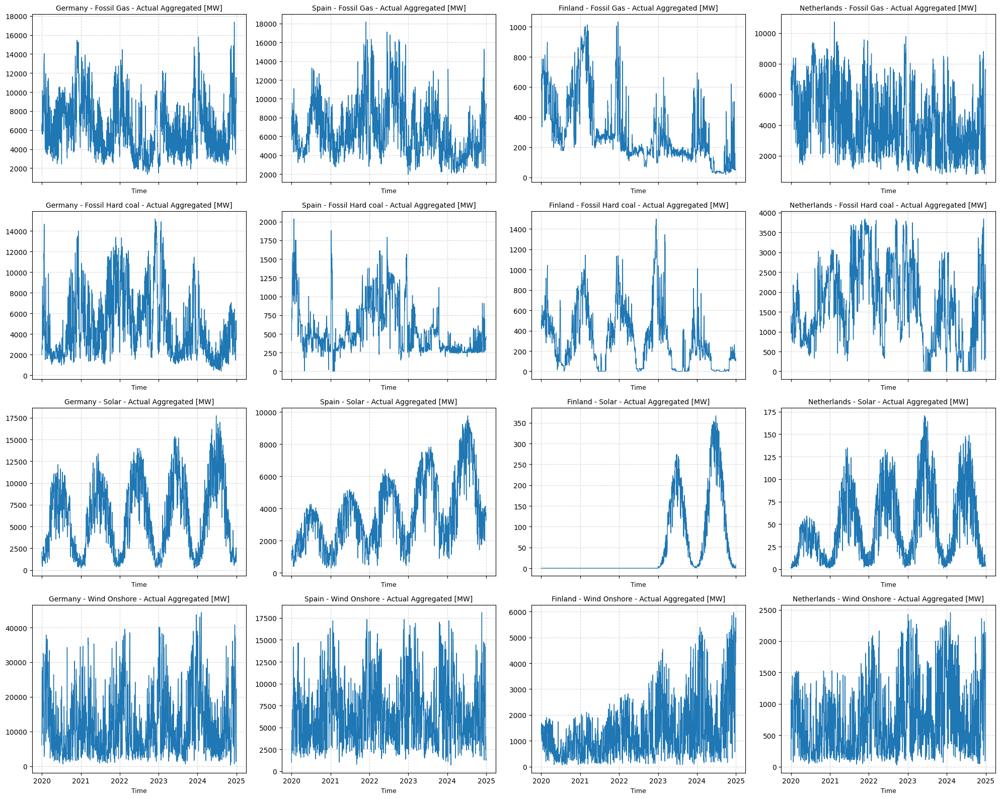

In [16]:
# Assume you have four DataFrames with the same structure
dfs = [germany_daily_mean, spain_daily_mean, finland_daily_mean, netherlands_daily_mean]
df_names = ["Germany", "Spain", "Finland", "Netherlands"]

# List of features to plot
features = ["Fossil Gas - Actual Aggregated [MW]", "Fossil Hard coal - Actual Aggregated [MW]", "Solar - Actual Aggregated [MW]", "Wind Onshore - Actual Aggregated [MW]"]

# Determine the number of rows and columns for the grid
n_features = len(features)
n_countries = len(dfs)

fig, axes = plt.subplots(n_features, n_countries, figsize=(5 * n_countries, 4 * n_features), sharex=True)

# If there is only one row or one column, ensure axes is 2D
if n_features == 1:
    axes = np.expand_dims(axes, axis=0)
if n_countries == 1:
    axes = np.expand_dims(axes, axis=1)

# Loop over each country (column) and feature (row)
for col, (df, country) in enumerate(zip(dfs, df_names)):
    for row, feature in enumerate(features):
        ax = axes[row, col]
        # Plot the time series for the feature
        ax.plot(df.index, df[feature], label=country, color='#1f77b4', lw=1)
        ax.set_title(f"{country} - {feature}", fontsize=10)
        ax.set_xlabel("Time", fontsize=9)

        ax.grid(True, linestyle='--', alpha=0.5)
plt.tight_layout()
plt.show()

In [17]:
finland_daily_mean.head()

,Fossil Gas - Actual Aggregated [MW],Fossil Hard coal - Actual Aggregated [MW],Solar - Actual Aggregated [MW],Wind Onshore - Actual Aggregated [MW]
start_time,,,,
2020-01-01,652.250000,496.625000,0.0,1258.291667
2020-01-02,644.541667,424.708333,0.0,1640.750000
2020-01-03,626.000000,417.125000,0.0,1678.166667
2020-01-04,576.958333,432.875000,0.0,1504.875000
2020-01-05,685.041667,526.208333,0.0,1155.291667


In [18]:
germany_daily_mean.head()

,Fossil Gas - Actual Aggregated [MW],Fossil Hard coal - Actual Aggregated [MW],Solar - Actual Aggregated [MW],Wind Onshore - Actual Aggregated [MW]
start_time,,,,
2020-01-01,5896.947917,1975.645833,2082.604167,6124.541667
2020-01-02,6654.677083,2468.875000,1647.687500,10363.593750
2020-01-03,5781.968750,2968.895833,746.625000,26476.531250
2020-01-04,5546.385417,2980.572917,551.750000,28557.770833
2020-01-05,6734.729167,2514.750000,1043.697917,9339.593750


In [19]:
netherlands_daily_mean.head()

,Fossil Gas - Actual Aggregated [MW],Fossil Hard coal - Actual Aggregated [MW],Solar - Actual Aggregated [MW],Wind Onshore - Actual Aggregated [MW]
start_time,,,,
2020-01-01,6280.895833,1394.260417,2.083333,109.677083
2020-01-02,7140.875000,1004.416667,1.114583,503.135417
2020-01-03,6320.135417,963.208333,1.260417,1068.218750
2020-01-04,6282.437500,968.604167,2.427083,810.520833
2020-01-05,6806.385417,1023.697917,1.364583,444.687500


In [20]:
spain_daily_mean.head()

,Fossil Gas - Actual Aggregated [MW],Fossil Hard coal - Actual Aggregated [MW],Solar - Actual Aggregated [MW],Wind Onshore - Actual Aggregated [MW]
start_time,,,,
2020-01-01,6765.916667,411.875000,1192.875000,1023.458333
2020-01-02,8118.125000,619.708333,976.875000,3018.791667
2020-01-03,7270.250000,678.791667,784.458333,3280.750000
2020-01-04,5646.625000,678.416667,1073.250000,4679.625000
2020-01-05,5732.166667,846.583333,1391.208333,2509.625000


### **STANDARDIZATION OF THE DATASET FUNCTION**

In [21]:
def compute_normalization(df):
    # Ensure the index is datetime
    df = df.copy()
    if not isinstance(df.index, pd.DatetimeIndex):
        raise ValueError("Index must be a DatetimeIndex for monthly normalization.")

    # Extract month number (1–12)
    df['month'] = df.index.month

    # Compute overall mean and std for each calendar month (across all years)
    monthly_mean = df.groupby('month').transform('mean')
    monthly_std = df.groupby('month').transform('std')

    # Normalize using the monthly statistics
    normalized_df = (df - monthly_mean) / (monthly_std + 4e-7)

    # Drop the helper 'month' column
    normalized_df.drop(columns='month', inplace=True)

    return normalized_df.dropna()

### **STANDARDIZIND THE DATASET**

In [22]:
finland_daily_normalized = compute_normalization(finland_daily_mean)
germany_daily_normalized = compute_normalization(germany_daily_mean)
netherlands_daily_normalized = compute_normalization(netherlands_daily_mean)
spain_daily_normalized = compute_normalization(spain_daily_mean)

### **PLOTTING THE STANDARDIZED DATA**

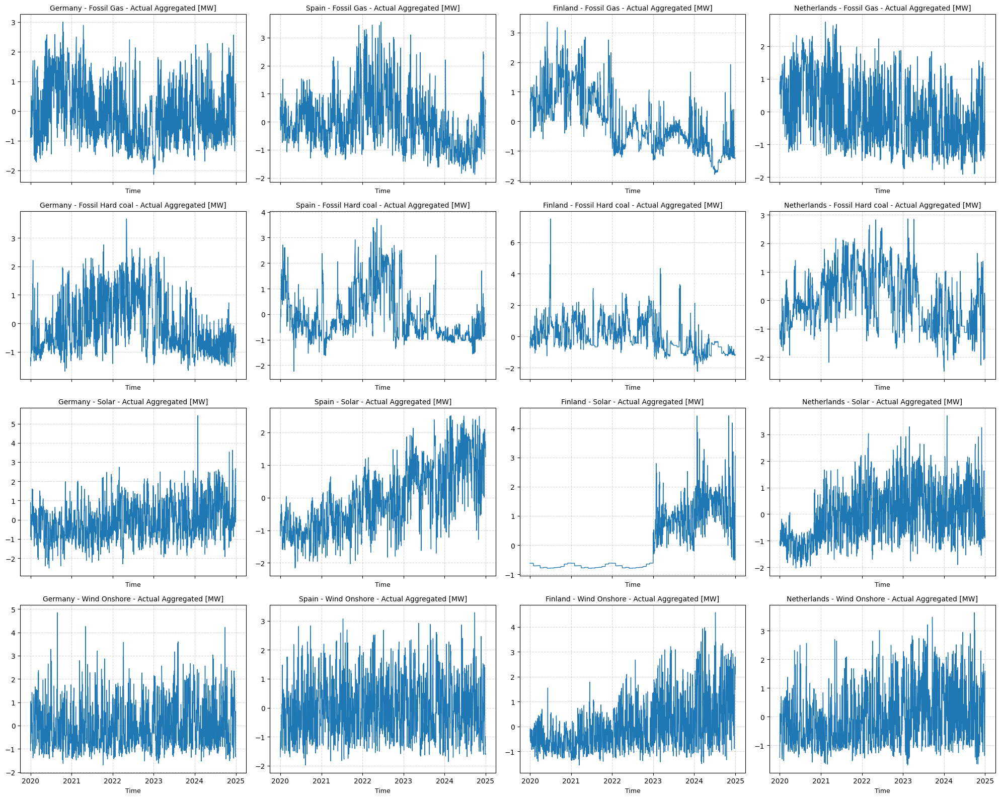

In [23]:
# The four DataFrames with the same structure:
dfs = [germany_daily_normalized, spain_daily_normalized, finland_daily_normalized, netherlands_daily_normalized]
df_names = ["Germany", "Spain", "Finland", "Netherlands"]

# List of features to plot
features = ["Fossil Gas - Actual Aggregated [MW]", "Fossil Hard coal - Actual Aggregated [MW]", "Solar - Actual Aggregated [MW]", "Wind Onshore - Actual Aggregated [MW]"]

# Determine the number of rows and columns for the grid
n_features = len(features)
n_countries = len(dfs)

fig, axes = plt.subplots(n_features, n_countries, figsize=(5 * n_countries, 4 * n_features), sharex=True)

# If there is only one row or one column, ensure axes is 2D
if n_features == 1:
    axes = np.expand_dims(axes, axis=0)
if n_countries == 1:
    axes = np.expand_dims(axes, axis=1)

# Loop over each country (column) and feature (row)
for col, (df, country) in enumerate(zip(dfs, df_names)):
    for row, feature in enumerate(features):
        ax = axes[row, col]
        # Plot the time series for the feature
        ax.plot(df.index, df[feature], label=country, color='#1f77b4', lw=1)
        ax.set_title(f"{country} - {feature}", fontsize=10)
        ax.set_xlabel("Time", fontsize=9)

        ax.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

### **DICKEY FULLER TEST**
This testwas carried out to test the data statististically for a check of stationarity

In [24]:
# Dictionary of the actual daily normalized data
countries_data = {"Germany": germany_daily_normalized, "Spain": spain_daily_normalized, "Finland": finland_daily_normalized, "Netherlands": netherlands_daily_normalized}

# Features to test
features = ["Fossil Gas - Actual Aggregated [MW]", "Fossil Hard coal - Actual Aggregated [MW]", "Solar - Actual Aggregated [MW]", "Wind Onshore - Actual Aggregated [MW]"]

# Loop through each country and feature
for country, df in countries_data.items():
    print(f"\n=== ADF Test Results for {country} ===")
    for feature in features:
        series = df[feature].dropna()

        # Skip short series
        if len(series) < 20:
            print(f"'{feature}': Insufficient data (length={len(series)}). Skipped.")
            continue

        # Run ADF test
        result = adfuller(series)
        test_stat = result[0]
        p_value = result[1]
        critical_values = result[4]

        # Output
        print(f"\nFeature: {feature}")
        print(f"Test Statistic: {test_stat:.4f}")
        print(f"P-value: {p_value:.4f}")
        print("Critical Values:")
        for key, value in critical_values.items():
            print(f"    {key}: {value:.4f}")

        if p_value < 0.05:
            print("=> Likely Stationary (Reject H₀)")
        else:
            print("=> Not Stationary (Fail to Reject H₀)")


=== ADF Test Results for Germany ===

Feature: Fossil Gas - Actual Aggregated [MW]
Test Statistic: -5.8401
P-value: 0.0000
Critical Values:
    1%: -3.4340
    5%: -2.8631
    10%: -2.5676
=> Likely Stationary (Reject H₀)

Feature: Fossil Hard coal - Actual Aggregated [MW]
Test Statistic: -4.3117
P-value: 0.0004
Critical Values:
    1%: -3.4340
    5%: -2.8631
    10%: -2.5676
=> Likely Stationary (Reject H₀)

Feature: Solar - Actual Aggregated [MW]
Test Statistic: -5.5491
P-value: 0.0000
Critical Values:
    1%: -3.4340
    5%: -2.8631
    10%: -2.5676
=> Likely Stationary (Reject H₀)

Feature: Wind Onshore - Actual Aggregated [MW]
Test Statistic: -18.2963
P-value: 0.0000
Critical Values:
    1%: -3.4339
    5%: -2.8631
    10%: -2.5676
=> Likely Stationary (Reject H₀)

=== ADF Test Results for Spain ===

Feature: Fossil Gas - Actual Aggregated [MW]
Test Statistic: -3.8420
P-value: 0.0025
Critical Values:
    1%: -3.4340
    5%: -2.8631
    10%: -2.5676
=> Likely Stationary (Reject H

### **CALCULATION OF ACF AND PACF CURVE**

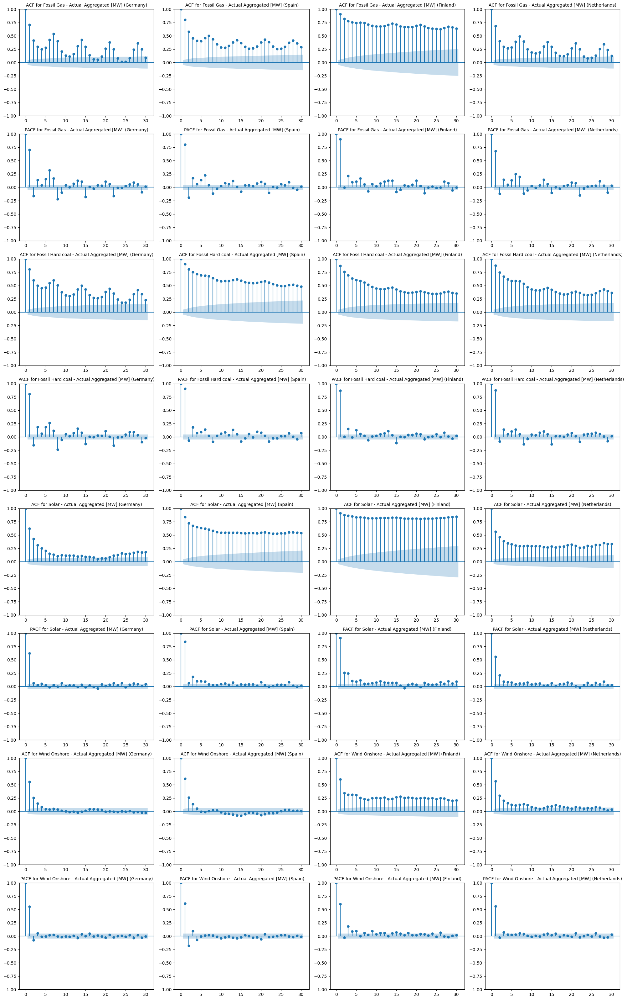

In [25]:
# Determine the grid dimensions
n_features = len(features)
n_countries = len(dfs)

# Create a figure and axes grid
fig, axes = plt.subplots(n_features * 2, n_countries, figsize=(5 * n_countries, 4 * n_features * 2))

# Loop through countries and features
for col, (df, country) in enumerate(zip(dfs, df_names)):
    for row, feature in enumerate(features):
        # ACF plot
        ax_acf = axes[row * 2, col]
        plot_acf(df[feature].dropna(), lags=30, ax=ax_acf)
        ax_acf.set_title(f'ACF for {feature} ({country})', fontsize=10)

        # PACF plot
        ax_pacf = axes[row * 2 + 1, col]
        plot_pacf(df[feature].dropna(), lags=30, ax=ax_pacf)
        ax_pacf.set_title(f'PACF for {feature} ({country})', fontsize=10)

plt.tight_layout()
plt.show()

### **PERIODOGRAM PLOT**
This was used to get the periodic cycle of each energy source

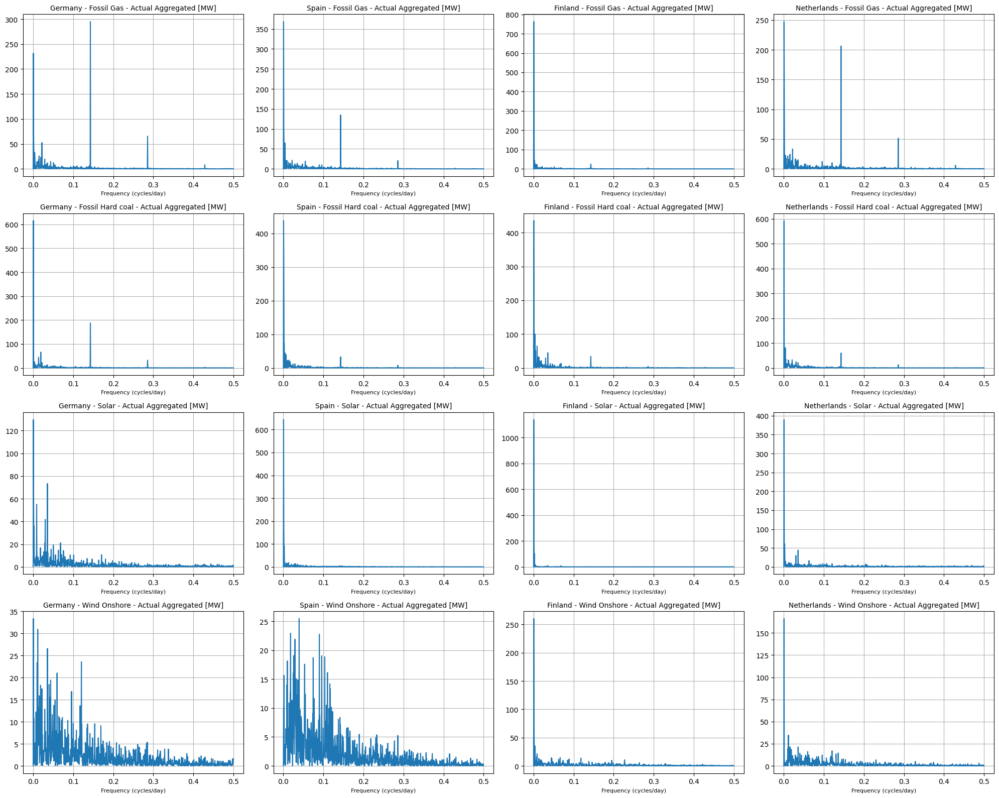

In [26]:
# Create a figure and axes grid
fig, axes = plt.subplots(n_features, n_countries, figsize=(5 * n_countries, 4 * n_features))

# Loop through countries and features
for col, (df, country) in enumerate(zip(dfs, df_names)):
    for row, feature in enumerate(features):
        # Get the data for the current feature and country
        data = df[feature].dropna()

        # Calculate the periodogram
        frequencies, power_spectrum = scipy.signal.periodogram(data)

        # Plot the periodogram on the corresponding subplot
        ax = axes[row, col]
        ax.plot(frequencies, power_spectrum)
        ax.set_title(f"{country} - {feature}", fontsize=10)
        ax.set_xlabel("Frequency (cycles/day)", fontsize=8)
        ax.grid(True)

plt.tight_layout()
plt.show()

### **FITTING SARIMA MODEL**

After carefully selecting the order of the model, here is the fitting of the model on the dataset

Germany - Fossil Gas - Actual Aggregated [MW]
                                        SARIMAX Results                                        
Dep. Variable:     Fossil Gas - Actual Aggregated [MW]   No. Observations:                 1827
Model:                   SARIMAX(1, 0, 1)x(1, 0, 1, 7)   Log Likelihood               -1686.556
Date:                                 Thu, 12 Jun 2025   AIC                           3387.113
Time:                                         15:15:19   BIC                           3425.651
Sample:                                     01-01-2020   HQIC                          3401.332
                                          - 12-31-2024                                         
Covariance Type:                                   opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.1191      0

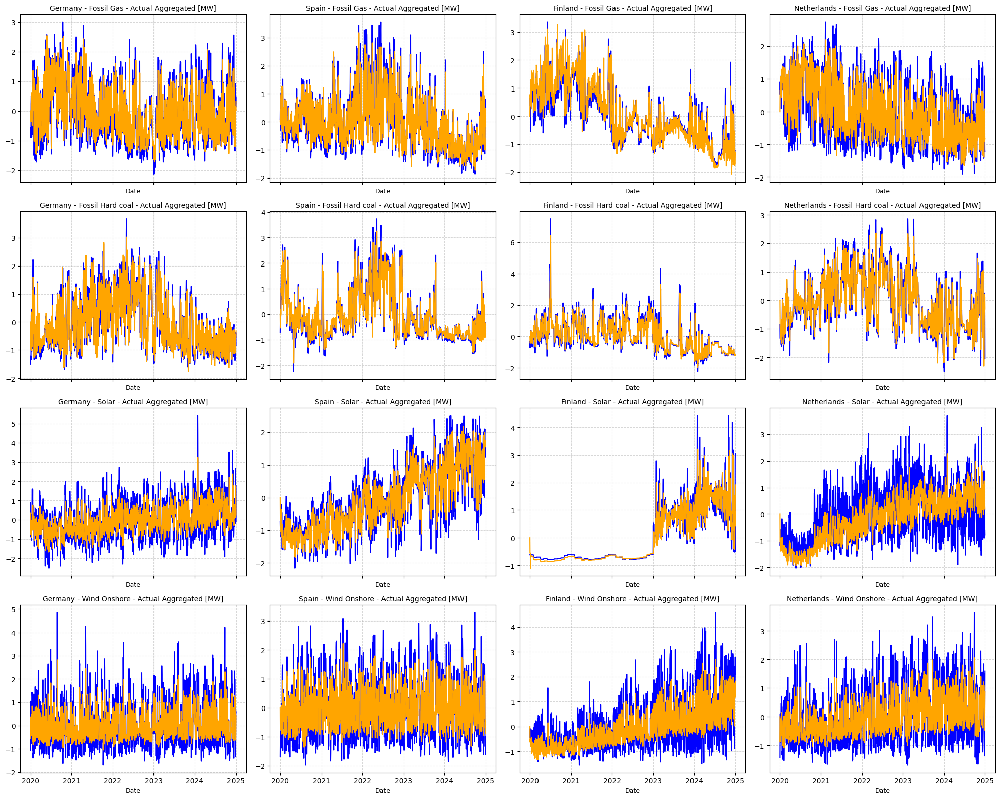

In [27]:
# Suppress convergence warnings
warnings.filterwarnings("ignore")

# Define a dictionary to store the data for each country
countries_data = {"Germany": germany_daily_normalized, "Spain": spain_daily_normalized, "Finland": finland_daily_normalized, "Netherlands": netherlands_daily_normalized}

# Define the features to model
features = ["Fossil Gas - Actual Aggregated [MW]", "Fossil Hard coal - Actual Aggregated [MW]", "Solar - Actual Aggregated [MW]", "Wind Onshore - Actual Aggregated [MW]"]

# Determine the grid dimensions
n_features = len(features)
n_countries = len(countries_data)

# Create a figure and axes grid
fig, axes = plt.subplots(n_features, n_countries, figsize=(5 * n_countries, 4 * n_features), sharex=True)

# Loop through countries and features
for col, (country, data) in enumerate(countries_data.items()):
    for row, feature in enumerate(features):
        series = data[feature].dropna()

        # Fit SARIMAX model with trend='ct'
        model = SARIMAX(series, order=(1, 0, 1), seasonal_order=(1, 0, 1, 7), trend='ct', enforce_stationarity=False, enforce_invertibility=False)
        results = model.fit(disp=False)
        print(f"{country} - {feature}")
        print(results.summary())

        # Make in-sample predictions
        predictions = results.get_prediction(start=series.index[0], end=series.index[-1])
        pred_mean = predictions.predicted_mean

        # Evaluate the model
        mse = mean_squared_error(series, pred_mean)
        print(f"MSE for {country}, {feature}: {mse:.4f}\n")

        # Plot actual vs predicted
        ax = axes[row, col]
        ax.plot(series.index, series, label='Actual', color='blue')
        ax.plot(pred_mean.index, pred_mean, label='Predicted', color='orange')
        ax.set_title(f"{country} - {feature}", fontsize=10)
        ax.set_xlabel("Date", fontsize=9)
        ax.grid(True, linestyle='--', alpha=0.5)

# Adjust layout and show the plot
plt.tight_layout()
plt.savefig('model_comparison.pdf')
plt.show()

### **FITTING THE RESIDUAL PLOT**

The residual plot will be plotted to check if there are any significant autocorrelations or partial autocorrelations left in the residuals. Ideally, the residuals should be uncorrelated.

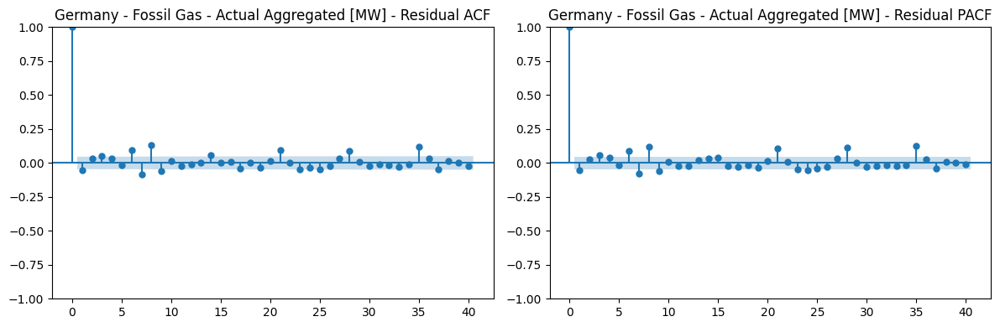

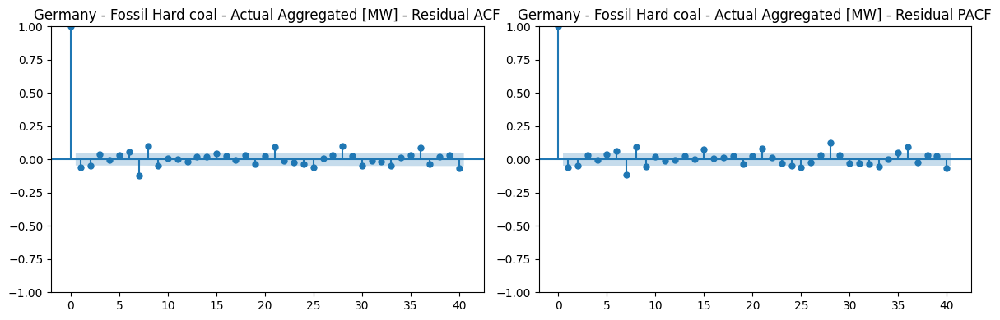

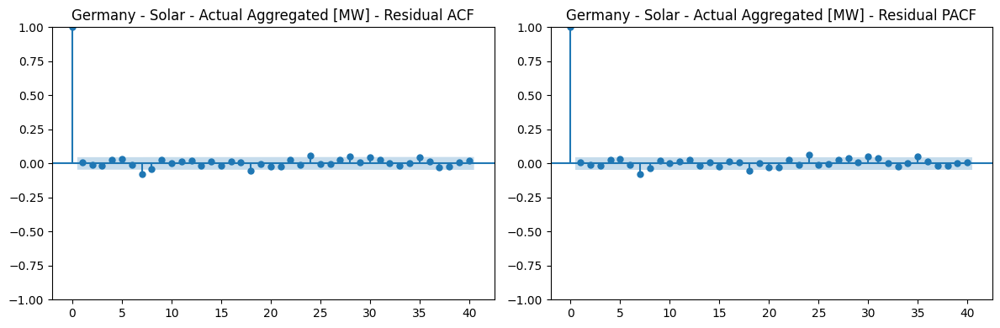

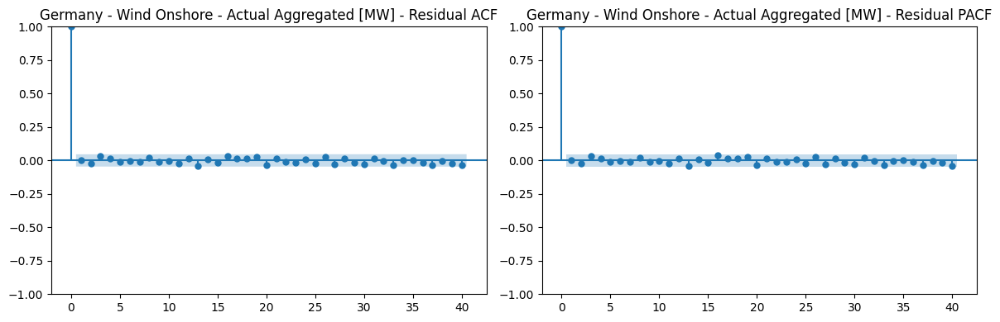

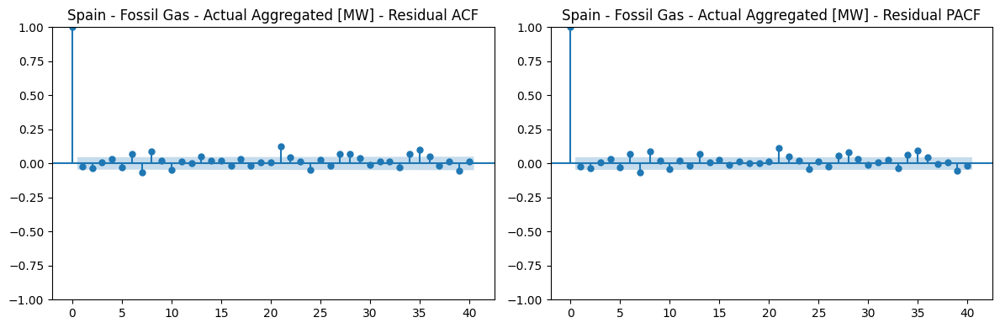

...

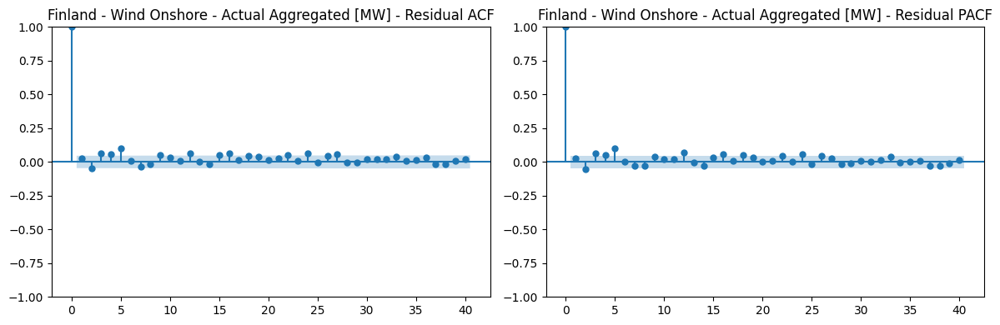

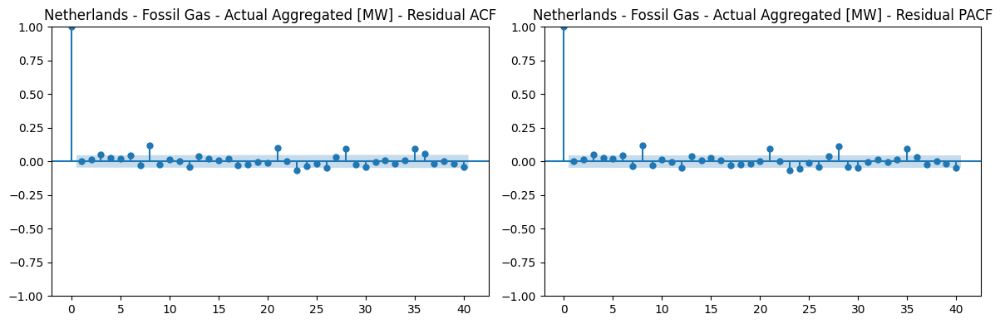

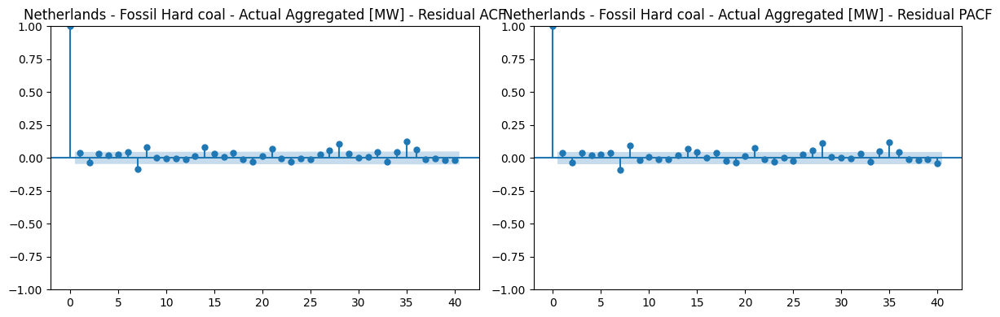

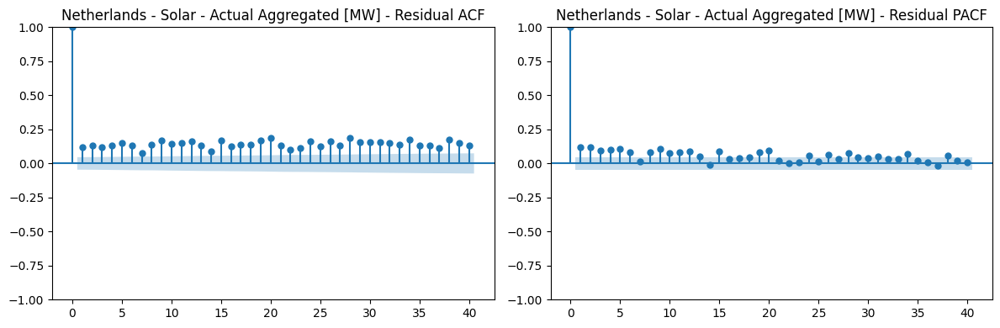

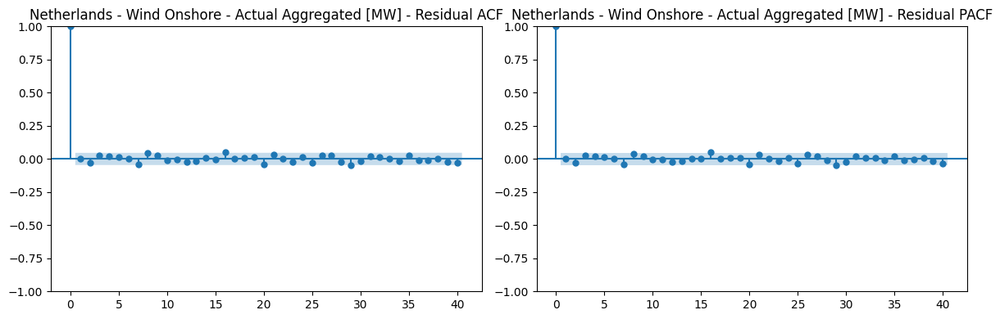

In [28]:
# Assume countries_data and features are already defined
n_features = len(features)
n_countries = len(countries_data)

# Loop through countries and features
for col, (country, data) in enumerate(countries_data.items()):
    for row, feature in enumerate(features):
        series = data[feature].dropna()

        # Fit SARIMAX model
        model = SARIMAX(series, order=(1, 0, 1), seasonal_order=(1, 0, 1, 7), trend='ct', enforce_stationarity=False, enforce_invertibility=False)
        results = model.fit(disp=False)

        # Residuals
        residuals = results.resid

        # Plot ACF and PACF
        fig, axes = plt.subplots(1, 2, figsize=(12, 4))
        plot_acf(residuals, ax=axes[0], lags=40)
        plot_pacf(residuals, ax=axes[1], lags=40)
        axes[0].set_title(f"{country} - {feature} - Residual ACF")
        axes[1].set_title(f"{country} - {feature} - Residual PACF")
        plt.tight_layout()
        plt.show()

### **RESIDUAL PLOT**
This plot the residual to check if there is any remaining structure not captured.

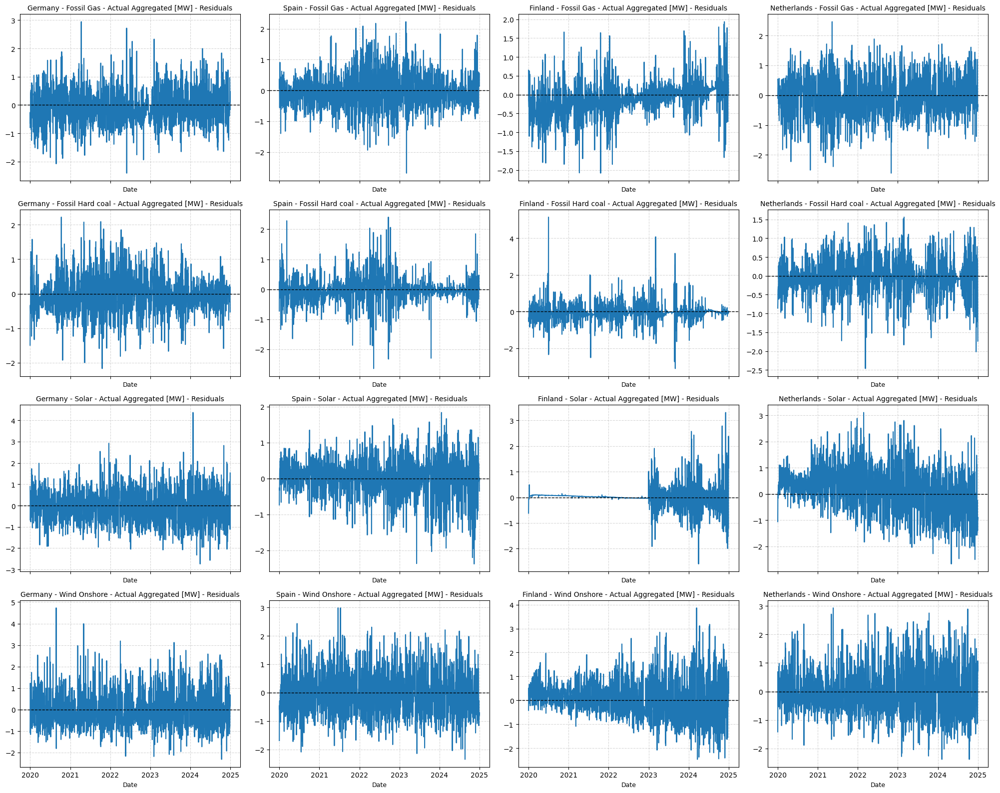

In [29]:
# Create a figure and axes grid for residuals
fig, axes = plt.subplots(n_features, n_countries, figsize=(5 * n_countries, 4 * n_features), sharex=True)

# Loop through countries and features
for col, (country, data) in enumerate(countries_data.items()):
    for row, feature in enumerate(features):
        series = data[feature].dropna()

        # Fit SARIMAX model
        model = SARIMAX(series, order=(1, 0, 1), seasonal_order=(1, 0, 1, 7), trend='ct', enforce_stationarity=False, enforce_invertibility=False)
        results = model.fit(disp=False)

        # Residuals
        residuals = results.resid

        # Plot residuals
        ax = axes[row, col]
        ax.plot(residuals.index, residuals, label='Residuals', color='#1f77b4')
        ax.axhline(y=0, color='black', linestyle='--', linewidth=1)
        ax.set_title(f"{country} - {feature} - Residuals", fontsize=10)
        ax.set_xlabel("Date", fontsize=9)
        ax.grid(True, linestyle='--', alpha=0.5)

# Adjust layout
plt.tight_layout()
plt.show()

### **PLOTTING THE COEFFICENTS IN BAR CHART OF THE AR, MA, SEASONAL AR, SEASONAL MA.**

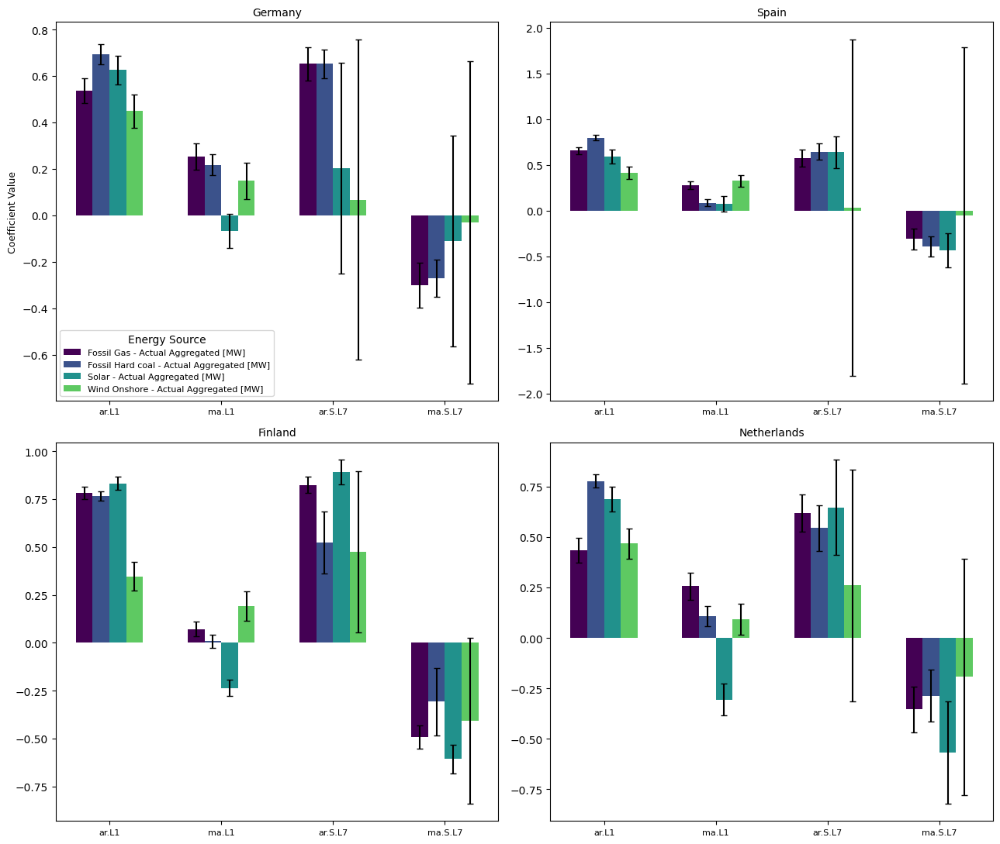

In [30]:
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

countries_data = {"Germany": germany_daily_normalized, "Spain": spain_daily_normalized, "Finland": finland_daily_normalized, "Netherlands": netherlands_daily_normalized}

features = ["Fossil Gas - Actual Aggregated [MW]", "Fossil Hard coal - Actual Aggregated [MW]", "Solar - Actual Aggregated [MW]", "Wind Onshore - Actual Aggregated [MW]"]

# Now includes the seasonal moving average component
coefficient_types = ['ar.L1', 'ma.L1', 'ar.S.L7', 'ma.S.L7']
coefficients_data = {country: {} for country in countries_data}
conf_interval_data = {country: {} for country in countries_data}
residual_var_data = {country: {} for country in countries_data}

# Fit SARIMAX and store results
for country, data in countries_data.items():
    for feature in features:
        series = data[feature].dropna()
        if len(series) > 7:
            try:
                model = SARIMAX(series, order=(1, 0, 1), seasonal_order=(1, 0, 1, 7), trend='ct', enforce_stationarity=False, enforce_invertibility=False)
                results = model.fit(disp=False)
                params = results.params
                conf_int = results.conf_int()
                residual_var = np.var(results.resid)

                # Store coefficients
                coefficients_data[country][feature] = {
                    key: params.get(key, np.nan) for key in coefficient_types
                }

                # Store confidence intervals
                conf_interval_data[country][feature] = {
                    key: (
                        params.get(key, np.nan) - conf_int.loc[key, 0],
                        conf_int.loc[key, 1] - params.get(key, np.nan)
                    ) if key in conf_int.index else (0, 0)
                    for key in coefficient_types
                }

                residual_var_data[country][feature] = residual_var

            except Exception as e:
                coefficients_data[country][feature] = {k: np.nan for k in coefficient_types}
                conf_interval_data[country][feature] = {k: (0, 0) for k in coefficient_types}
                residual_var_data[country][feature] = np.nan
        else:
            coefficients_data[country][feature] = {k: np.nan for k in coefficient_types}
            conf_interval_data[country][feature] = {k: (0, 0) for k in coefficient_types}
            residual_var_data[country][feature] = np.nan

# Plotting
countries = list(countries_data.keys())
n_cols = 2
n_rows = (len(countries) + n_cols - 1) // n_cols
fig, axes = plt.subplots(n_rows, n_cols, figsize=(13, 11))
axes = axes.flatten()

width = 0.15
offsets = np.linspace(-1.5 * width, 1.5 * width, len(features))

for i, country in enumerate(countries):
    ax = axes[i]
    x = np.arange(len(coefficient_types))

    for j, feature in enumerate(features):
        coeffs = coefficients_data[country].get(feature, {})
        confs = conf_interval_data[country].get(feature, {})

        for k, coeff_type in enumerate(coefficient_types):
            val = coeffs.get(coeff_type, np.nan)
            err = confs.get(coeff_type, (0, 0))
            if not np.isnan(val):
                ax.bar(x[k] + offsets[j], val, width,
                       yerr=np.array([[err[0]], [err[1]]]), capsize=3,
                       label=feature if k == 0 else "",
                       color=plt.cm.viridis(j / len(features)))

    ax.set_title(country, fontsize=10)
    ax.set_xticks(x)
    ax.set_xticklabels(coefficient_types, fontsize=8)
    if i == 0:
        ax.legend(title="Energy Source", fontsize=8)
        ax.set_ylabel('Coefficient Value', fontsize=9)

for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()

### **VARMAX MODEL**

To better understand the interdependence between different energy sources within the same country, we extended our analysis beyond assessing how the past values of a single energy source influence its own future behavior. Specifically, we examined whether one energy source's past observations could help predict the behavior of another. This motivated the use of a Vector Autoregressive Moving Average with Exogenous variables (VARMAX) model. The VARMAX framework allows us to quantify not only the self-dependence of each energy source over time but also the extent to which different energy sources influence each other. This multivariate approach provides a more comprehensive view of the dynamic interactions among fossil gas, coal, solar, and wind energy sources.

### **Across other energy source in Germany**

This analysis investigates the dynamic relationships among various energy sources in Germany, assessing how each source influences both itself and the others.

Fitting VARMAX(1,1) with trend='ct' for Germany...
Model fitted successfully.
                                                                                                  Statespace Model Results                                                                                                 
Dep. Variable:     ['Fossil Gas - Actual Aggregated [MW]', 'Fossil Hard coal - Actual Aggregated [MW]', 'Solar - Actual Aggregated [MW]', 'Wind Onshore - Actual Aggregated [MW]']   No. Observations:                 1827
Model:                                                                                                                                                                  VARMA(1,1)   Log Likelihood               -6882.435
                                                                                                                                                                       + intercept   AIC                          13864.870
Date:                                     

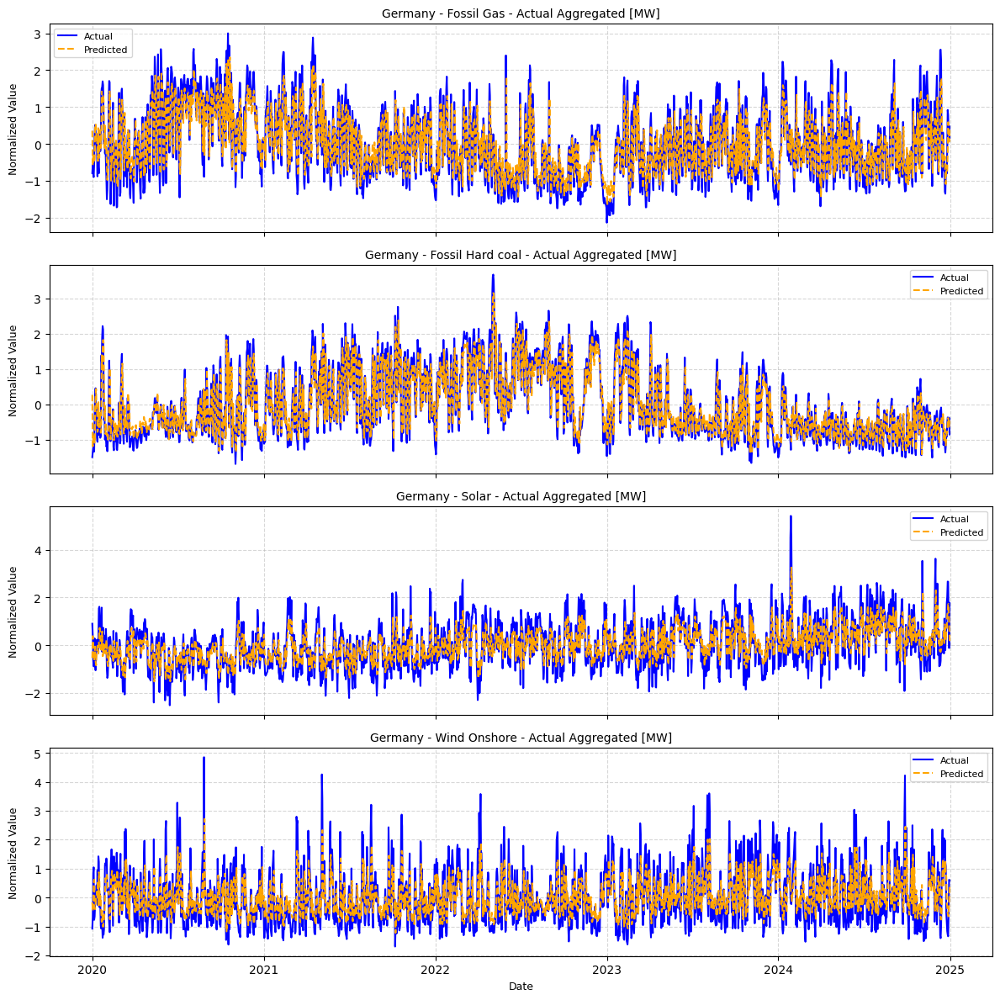

In [31]:
# Suppress warnings
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

# Input: Data & Setup
country_to_analyze = "Germany"
features_to_compare = ["Fossil Gas - Actual Aggregated [MW]", "Fossil Hard coal - Actual Aggregated [MW]", "Solar - Actual Aggregated [MW]", "Wind Onshore - Actual Aggregated [MW]"]

# Extract Germany Data
varmax_data = germany_daily_normalized[features_to_compare].dropna()

# Fit VARMAX Model with Trend
try:
    print(f"Fitting VARMAX({1},{1}) with trend='ct' for {country_to_analyze}...")

    model = VARMAX(varmax_data, order=(1, 1), trend='ct')
    results = model.fit(disp=False)

    print("Model fitted successfully.")
    print(results.summary())

    # Prediction
    predictions = results.predict(start=0, end=len(varmax_data)-1)

    # Evaluation
    print(f"\nMean Squared Error (MSE) for each energy type in {country_to_analyze}:")
    for feature in features_to_compare:
        mse = mean_squared_error(varmax_data[feature], predictions[feature])
        print(f"  {feature}: {mse:.4f}")

    # Plot Actual vs Predicted
    fig, axes = plt.subplots(len(features_to_compare), 1, figsize=(12, len(features_to_compare)*3), sharex=True)

    for i, feature in enumerate(features_to_compare):
        ax = axes[i]
        ax.plot(varmax_data.index, varmax_data[feature], label='Actual', color='blue')
        ax.plot(predictions.index, predictions[feature], label='Predicted', color='orange', linestyle='--')
        ax.set_title(f"{country_to_analyze} - {feature}", fontsize=10)
        ax.set_ylabel("Normalized Value", fontsize=9)
        ax.legend(fontsize=8)
        ax.grid(True, linestyle='--', alpha=0.5)

    axes[-1].set_xlabel("Date", fontsize=9)
    plt.tight_layout()
    plt.show()

except Exception as e:
    print(f"An error occurred: {e}")

### **Across other energy source in Finland**

This analysis investigates the dynamic relationships among various energy sources in Finland, assessing how each source influences both itself and the others.

Fitting VARMAX(1,1) with trend='ct' for Finland...
Model fitted successfully.
                                                                                                  Statespace Model Results                                                                                                 
Dep. Variable:     ['Fossil Gas - Actual Aggregated [MW]', 'Fossil Hard coal - Actual Aggregated [MW]', 'Solar - Actual Aggregated [MW]', 'Wind Onshore - Actual Aggregated [MW]']   No. Observations:                 1827
Model:                                                                                                                                                                  VARMA(1,1)   Log Likelihood               -4926.224
                                                                                                                                                                       + intercept   AIC                           9952.447
Date:                                     

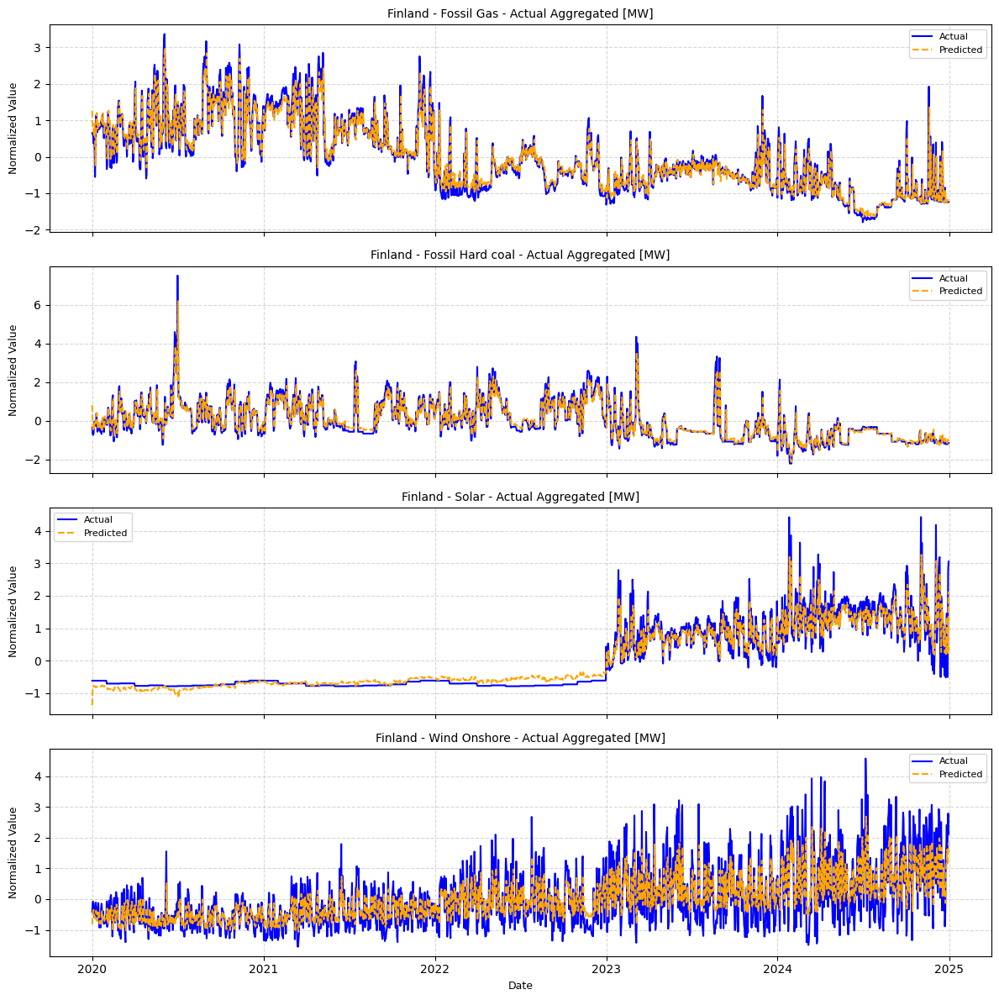

In [32]:
# Suppress warnings
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

# Input: Data & Setup
country_to_analyze = "Finland"
features_to_compare = ["Fossil Gas - Actual Aggregated [MW]", "Fossil Hard coal - Actual Aggregated [MW]", "Solar - Actual Aggregated [MW]", "Wind Onshore - Actual Aggregated [MW]"]

# Extract Finland Data
varmax_data = finland_daily_normalized[features_to_compare].dropna()

try:
    print(f"Fitting VARMAX({1},{1}) with trend='ct' for {country_to_analyze}...")

    model = VARMAX(varmax_data, order=(1, 1), trend='ct')
    results = model.fit(disp=False)

    print("Model fitted successfully.")
    print(results.summary())

    predictions = results.predict(start=0, end=len(varmax_data)-1)

    print(f"\nMean Squared Error (MSE) for each energy type in {country_to_analyze}:")
    for feature in features_to_compare:
        mse = mean_squared_error(varmax_data[feature], predictions[feature])
        print(f"  {feature}: {mse:.4f}")

    fig, axes = plt.subplots(len(features_to_compare), 1, figsize=(12, len(features_to_compare)*3), sharex=True)

    for i, feature in enumerate(features_to_compare):
        ax = axes[i]
        ax.plot(varmax_data.index, varmax_data[feature], label='Actual', color='blue')
        ax.plot(predictions.index, predictions[feature], label='Predicted', color='orange', linestyle='--')
        ax.set_title(f"{country_to_analyze} - {feature}", fontsize=10)
        ax.set_ylabel("Normalized Value", fontsize=9)
        ax.legend(fontsize=8)
        ax.grid(True, linestyle='--', alpha=0.5)

    axes[-1].set_xlabel("Date", fontsize=9)
    plt.tight_layout()
    plt.show()

except Exception as e:
    print(f"An error occurred: {e}")

### **Across other energy source in Netherlands**

This analysis investigates the dynamic relationships among various energy sources in Netherlands, assessing how each source influences both itself and the others.

Fitting VARMAX(1,1) with trend='ct' for Netherlands...
Model fitted successfully.
                                                                                                  Statespace Model Results                                                                                                 
Dep. Variable:     ['Fossil Gas - Actual Aggregated [MW]', 'Fossil Hard coal - Actual Aggregated [MW]', 'Solar - Actual Aggregated [MW]', 'Wind Onshore - Actual Aggregated [MW]']   No. Observations:                 1827
Model:                                                                                                                                                                  VARMA(1,1)   Log Likelihood               -6808.462
                                                                                                                                                                       + intercept   AIC                          13716.924
Date:                                 

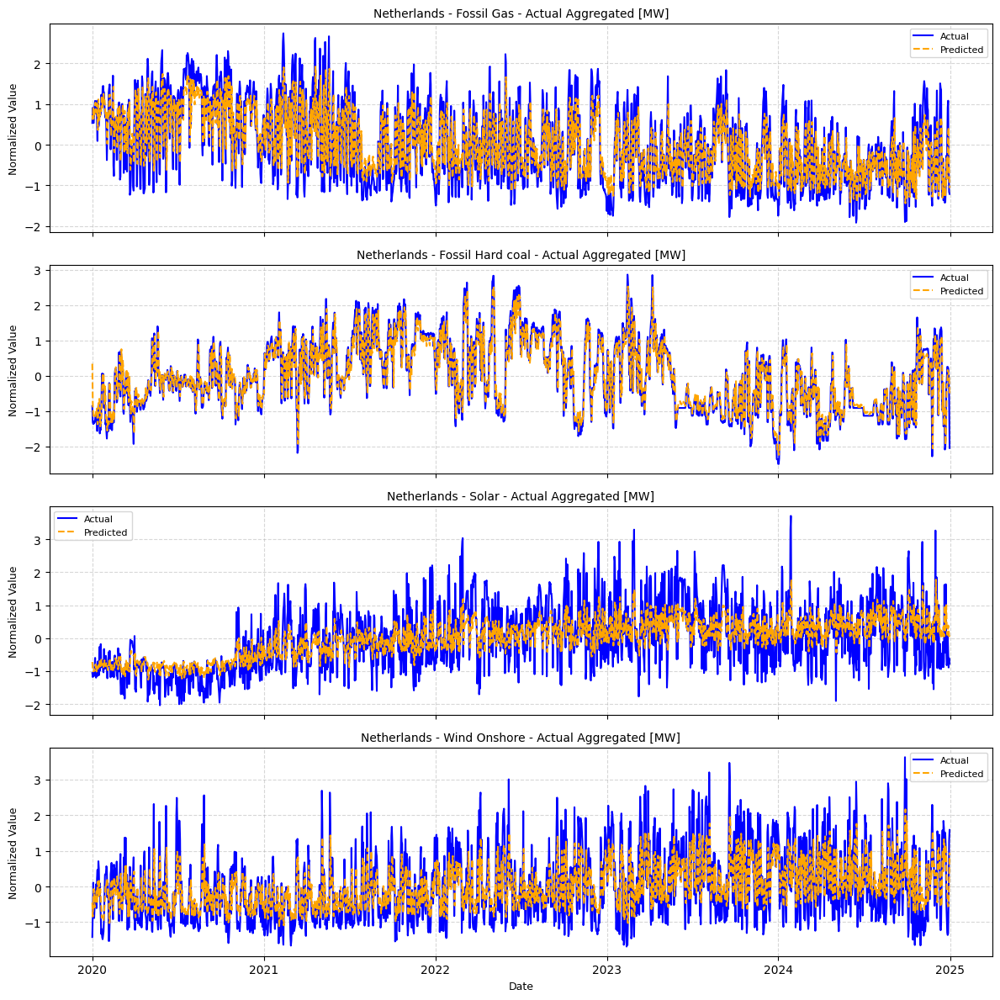

In [33]:
# Suppress warnings
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

# Input: Data & Setup
country_to_analyze = "Netherlands"
features_to_compare = ["Fossil Gas - Actual Aggregated [MW]", "Fossil Hard coal - Actual Aggregated [MW]", "Solar - Actual Aggregated [MW]", "Wind Onshore - Actual Aggregated [MW]"]

# Extract Netherlands Data
varmax_data = netherlands_daily_normalized[features_to_compare].dropna()

try:
    print(f"Fitting VARMAX({1},{1}) with trend='ct' for {country_to_analyze}...")

    model = VARMAX(varmax_data, order=(1, 1), trend='ct')
    results = model.fit(disp=False)

    print("Model fitted successfully.")
    print(results.summary())

    predictions = results.predict(start=0, end=len(varmax_data)-1)

    print(f"\nMean Squared Error (MSE) for each energy type in {country_to_analyze}:")
    for feature in features_to_compare:
        mse = mean_squared_error(varmax_data[feature], predictions[feature])
        print(f"  {feature}: {mse:.4f}")

    fig, axes = plt.subplots(len(features_to_compare), 1, figsize=(12, len(features_to_compare)*3), sharex=True)

    for i, feature in enumerate(features_to_compare):
        ax = axes[i]
        ax.plot(varmax_data.index, varmax_data[feature], label='Actual', color='blue')
        ax.plot(predictions.index, predictions[feature], label='Predicted', color='orange', linestyle='--')
        ax.set_title(f"{country_to_analyze} - {feature}", fontsize=10)
        ax.set_ylabel("Normalized Value", fontsize=9)
        ax.legend(fontsize=8)
        ax.grid(True, linestyle='--', alpha=0.5)

    axes[-1].set_xlabel("Date", fontsize=9)
    plt.tight_layout()
    plt.show()

except Exception as e:
    print(f"An error occurred: {e}")

### **Across other energy source in Spain**

This analysis investigates the dynamic relationships among various energy sources in Spain, assessing how each source influences both itself and the others.

Fitting VARMAX(1,1) with trend='ct' for Spain...
Model fitted successfully.
                                                                                                  Statespace Model Results                                                                                                 
Dep. Variable:     ['Fossil Gas - Actual Aggregated [MW]', 'Fossil Hard coal - Actual Aggregated [MW]', 'Solar - Actual Aggregated [MW]', 'Wind Onshore - Actual Aggregated [MW]']   No. Observations:                 1827
Model:                                                                                                                                                                  VARMA(1,1)   Log Likelihood               -5569.558
                                                                                                                                                                       + intercept   AIC                          11239.116
Date:                                       

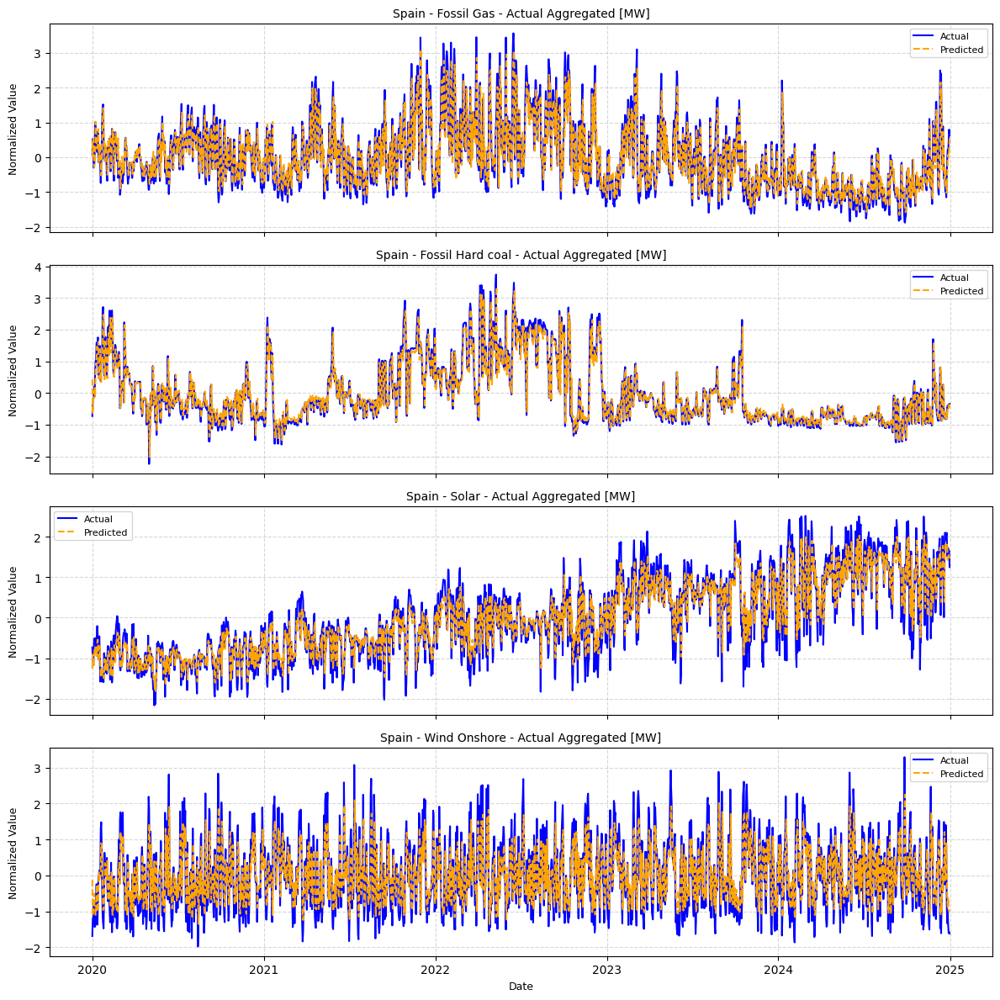

In [34]:
# Suppress warnings
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

# Input: Data & Setup
country_to_analyze = "Spain"
features_to_compare = ["Fossil Gas - Actual Aggregated [MW]", "Fossil Hard coal - Actual Aggregated [MW]", "Solar - Actual Aggregated [MW]", "Wind Onshore - Actual Aggregated [MW]"]

# Extract Spain Data
varmax_data = spain_daily_normalized[features_to_compare].dropna()

try:
    print(f"Fitting VARMAX({1},{1}) with trend='ct' for {country_to_analyze}...")

    model = VARMAX(varmax_data, order=(1, 1), trend='ct')
    results = model.fit(disp=False)

    print("Model fitted successfully.")
    print(results.summary())

    predictions = results.predict(start=0, end=len(varmax_data)-1)

    print(f"\nMean Squared Error (MSE) for each energy type in {country_to_analyze}:")
    for feature in features_to_compare:
        mse = mean_squared_error(varmax_data[feature], predictions[feature])
        print(f"  {feature}: {mse:.4f}")

    fig, axes = plt.subplots(len(features_to_compare), 1, figsize=(12, len(features_to_compare)*3), sharex=True)

    for i, feature in enumerate(features_to_compare):
        ax = axes[i]
        ax.plot(varmax_data.index, varmax_data[feature], label='Actual', color='blue')
        ax.plot(predictions.index, predictions[feature], label='Predicted', color='orange', linestyle='--')
        ax.set_title(f"{country_to_analyze} - {feature}", fontsize=10)
        ax.set_ylabel("Normalized Value", fontsize=9)
        ax.legend(fontsize=8)
        ax.grid(True, linestyle='--', alpha=0.5)

    axes[-1].set_xlabel("Date", fontsize=9)
    plt.tight_layout()
    plt.show()

except Exception as e:
    print(f"An error occurred: {e}")

### **IMPORTING THE TEST DATASET**

In [35]:
dataset_path2 = "/content/drive/MyDrive/Testdataset"

In [36]:
#list of folder in datase_path
folder_list2 = os.listdir(dataset_path2)

In [37]:
# get all the filename from folder_list
file_list2 = []
for folder in folder_list2:
    if not os.path.isdir(os.path.join(dataset_path2, folder)):
        continue
    file_list2.append(list(map(lambda x: os.path.join(folder, x), os.listdir(os.path.join(dataset_path2, folder)))))

In [38]:
file_list2

[['Finland/finland_2025.csv'],
 ['Netherland/netherland_2025.csv'],
 ['Germany/germany_2025.csv'],
 ['Spain/spain_2025.csv']]

In [39]:
#load all file in file list into on csv
all_df = []
for folder_file in file_list2:
  df = pd.DataFrame()
  for file in folder_file:
      df = pd.concat([df, pd.read_csv(os.path.join(dataset_path2, file))])
  all_df.append(df)

print(file_list2)

[['Finland/finland_2025.csv'], ['Netherland/netherland_2025.csv'], ['Germany/germany_2025.csv'], ['Spain/spain_2025.csv']]


In [40]:
finland_test_df, netherlands_test_df, germany_test_df, spain_test_df = all_df

In [41]:
def convert_to_datetime(df):
  df['start_time'] = df['MTU'].str.split(" - ").str[0]
  df = df.drop('MTU', axis=1)
  df['start_time'] = pd.to_datetime(df['start_time'], format="%d.%m.%Y %H:%M")
  df.set_index('start_time', inplace=True)
  return df

In [42]:
finland_test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8640 entries, 0 to 8639
Data columns (total 24 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   Area                                                      8640 non-null   object 
 1   MTU                                                       8640 non-null   object 
 2   Biomass - Actual Aggregated [MW]                          8636 non-null   float64
 3   Energy storage - Actual Aggregated [MW]                   8636 non-null   object 
 4   Fossil Brown coal/Lignite - Actual Aggregated [MW]        8636 non-null   object 
 5   Fossil Coal-derived gas - Actual Aggregated [MW]          8636 non-null   object 
 6   Fossil Gas - Actual Aggregated [MW]                       8636 non-null   float64
 7   Fossil Hard coal - Actual Aggregated [MW]                 8636 non-null   float64
 8   Fossil Oil - Actua

In [43]:
 finland_test_df.columns

Index(['Area', 'MTU', 'Biomass - Actual Aggregated [MW]',
       'Energy storage - Actual Aggregated [MW]',
       'Fossil Brown coal/Lignite - Actual Aggregated [MW]',
       'Fossil Coal-derived gas - Actual Aggregated [MW]',
       'Fossil Gas - Actual Aggregated [MW]',
       'Fossil Hard coal - Actual Aggregated [MW]',
       'Fossil Oil - Actual Aggregated [MW]',
       'Fossil Oil shale - Actual Aggregated [MW]',
       'Fossil Peat - Actual Aggregated [MW]',
       'Geothermal - Actual Aggregated [MW]',
       'Hydro Pumped Storage - Actual Aggregated [MW]',
       'Hydro Pumped Storage - Actual Consumption [MW]',
       'Hydro Run-of-river and poundage - Actual Aggregated [MW]',
       'Hydro Water Reservoir - Actual Aggregated [MW]',
       'Marine - Actual Aggregated [MW]', 'Nuclear - Actual Aggregated [MW]',
       'Other - Actual Aggregated [MW]',
       'Other renewable - Actual Aggregated [MW]',
       'Solar - Actual Aggregated [MW]', 'Waste - Actual Aggregated [MW]',
 

### **SUBSETTING THE FOUR ENERGY OF INTEREST AND CLEANING THE DATASET**

In [44]:
# select the desired columns for each dataframe before converting to datetime
finland_test_df = finland_test_df[['MTU','Fossil Gas - Actual Aggregated [MW]', 'Fossil Hard coal - Actual Aggregated [MW]',
       'Solar - Actual Aggregated [MW]', 'Wind Onshore - Actual Aggregated [MW]']]
finland_test_df.replace("n/e", np.nan, inplace=True)
finland_test_df.fillna(0, inplace=True)
# Convert relevant columns to numeric
for col in ['Fossil Gas - Actual Aggregated [MW]', 'Fossil Hard coal - Actual Aggregated [MW]',
       'Solar - Actual Aggregated [MW]', 'Wind Onshore - Actual Aggregated [MW]']:
    finland_test_df[col] = finland_test_df[col].astype(float)
finland_test_df = convert_to_datetime(finland_test_df)

germany_test_df = germany_test_df[['MTU','Fossil Gas - Actual Aggregated [MW]', 'Fossil Hard coal - Actual Aggregated [MW]',
       'Solar - Actual Aggregated [MW]', 'Wind Onshore - Actual Aggregated [MW]']]
germany_test_df.replace("n/e", np.nan, inplace=True)
germany_test_df.fillna(0, inplace=True)
for col in ['Fossil Gas - Actual Aggregated [MW]', 'Fossil Hard coal - Actual Aggregated [MW]',
       'Solar - Actual Aggregated [MW]', 'Wind Onshore - Actual Aggregated [MW]']:
    germany_test_df[col] = germany_test_df[col].astype(float)
germany_test_df = convert_to_datetime(germany_test_df)

netherlands_test_df = netherlands_test_df[['MTU','Fossil Gas - Actual Aggregated [MW]', 'Fossil Hard coal - Actual Aggregated [MW]',
       'Solar - Actual Aggregated [MW]', 'Wind Onshore - Actual Aggregated [MW]']]
for col in ['Fossil Gas - Actual Aggregated [MW]', 'Fossil Hard coal - Actual Aggregated [MW]',
       'Solar - Actual Aggregated [MW]', 'Wind Onshore - Actual Aggregated [MW]']:
    netherlands_test_df[col] = netherlands_test_df[col].astype(float)
netherlands_test_df = convert_to_datetime(netherlands_test_df)

spain_test_df = spain_test_df[['MTU','Fossil Gas - Actual Aggregated [MW]', 'Fossil Hard coal - Actual Aggregated [MW]',
       'Solar - Actual Aggregated [MW]', 'Wind Onshore - Actual Aggregated [MW]']]
for col in ['Fossil Gas - Actual Aggregated [MW]', 'Fossil Hard coal - Actual Aggregated [MW]',
       'Solar - Actual Aggregated [MW]', 'Wind Onshore - Actual Aggregated [MW]']:
    spain_test_df[col] = spain_test_df[col].astype(float)
spain_test_df = convert_to_datetime(spain_test_df)

### **Checking for Missing Data**

<Axes: ylabel='start_time'>

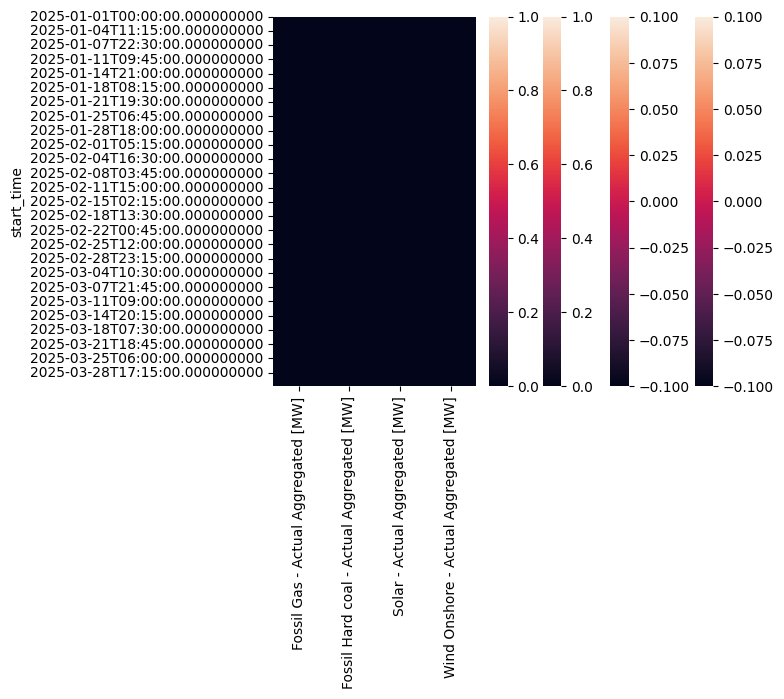

In [45]:
#plot na on heatmap
sns.heatmap(finland_test_df.isna())
sns.heatmap(germany_test_df.isna())
sns.heatmap(spain_test_df.isna())
sns.heatmap(netherlands_test_df.isna())

### **AGGREGATING FUNCTION**

In [46]:
def aggregete_daily_data(df):
  return df.resample('D').mean()

### **AGGREGATING THE DATASET**

In [47]:
finland_daily_test_mean = aggregete_daily_data(finland_test_df)
germany_daily_test_mean = aggregete_daily_data(germany_test_df)
netherlands_daily_test_mean = aggregete_daily_data(netherlands_test_df)
spain_daily_test_mean = aggregete_daily_data(spain_test_df)

In [48]:
finland_daily_test_mean.head()

,Fossil Gas - Actual Aggregated [MW],Fossil Hard coal - Actual Aggregated [MW],Solar - Actual Aggregated [MW],Wind Onshore - Actual Aggregated [MW]
start_time,,,,
2025-01-01,141.458333,146.885417,1.833333,1034.250000
2025-01-02,542.500000,153.854167,5.781250,731.718750
2025-01-03,586.718750,178.218750,6.302083,737.072917
2025-01-04,498.375000,213.385417,6.322917,944.604167
2025-01-05,255.312500,188.927083,7.885417,1213.020833


In [49]:
germany_daily_test_mean.head()

,Fossil Gas - Actual Aggregated [MW],Fossil Hard coal - Actual Aggregated [MW],Solar - Actual Aggregated [MW],Wind Onshore - Actual Aggregated [MW]
start_time,,,,
2025-01-01,3954.906250,2362.020833,2368.843750,37751.031250
2025-01-02,8224.833333,4189.750000,1229.416667,21135.927083
2025-01-03,8986.864583,4537.927083,1276.291667,28329.437500
2025-01-04,8305.229167,4962.791667,1153.447917,10837.937500
2025-01-05,6015.718750,1872.593750,380.291667,20739.781250


In [50]:
netherlands_daily_test_mean.head()

,Fossil Gas - Actual Aggregated [MW],Fossil Hard coal - Actual Aggregated [MW],Solar - Actual Aggregated [MW],Wind Onshore - Actual Aggregated [MW]
start_time,,,,
2025-01-01,949.885417,303.760417,2.239583,2145.604167
2025-01-02,4899.812500,1456.187500,21.031250,799.197917
2025-01-03,3333.437500,1695.843750,9.718750,1332.500000
2025-01-04,4882.062500,2578.729167,6.437500,519.864583
2025-01-05,1293.489583,1040.541667,2.802083,1456.885417


In [51]:
spain_daily_test_mean.head()

,Fossil Gas - Actual Aggregated [MW],Fossil Hard coal - Actual Aggregated [MW],Solar - Actual Aggregated [MW],Wind Onshore - Actual Aggregated [MW]
start_time,,,,
2025-01-01,5960.208333,284.375000,3298.208333,3934.541667
2025-01-02,6559.833333,432.625000,3957.458333,6534.583333
2025-01-03,4359.208333,339.458333,3076.083333,11991.916667
2025-01-04,4256.458333,277.250000,2833.833333,10063.416667
2025-01-05,2836.291667,270.916667,1567.708333,13238.625000


### **PLOTTING THE TEST DATASET**

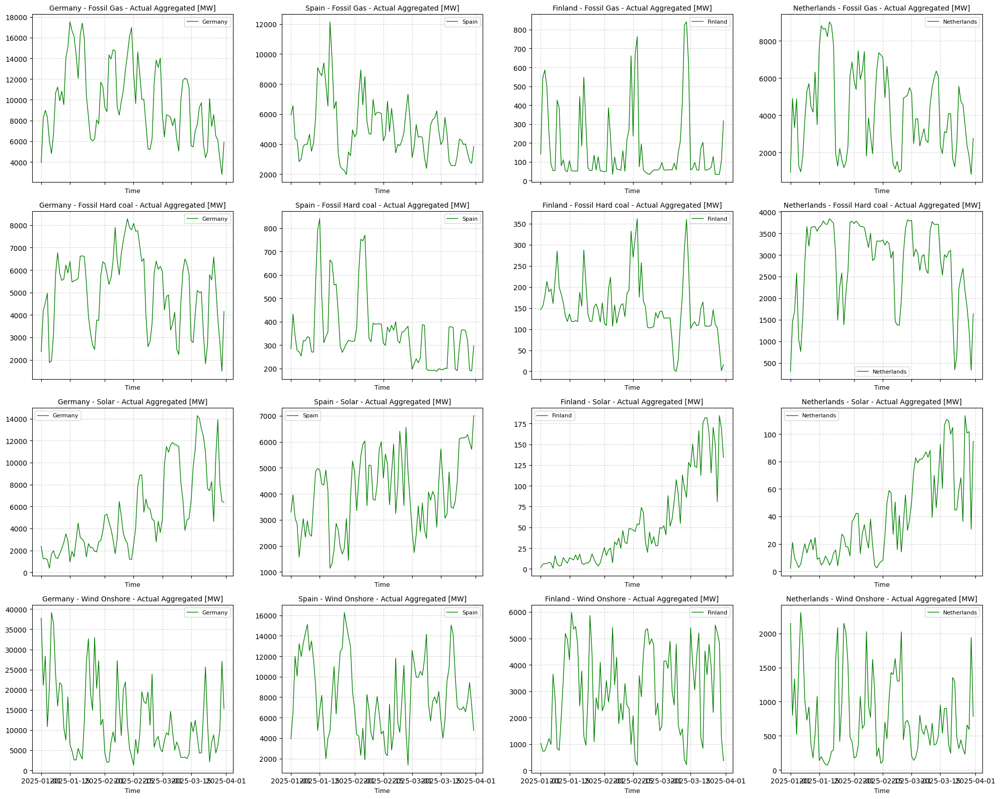

In [52]:
# Assume you have four DataFrames with the same structure:
dfs = [germany_daily_test_mean, spain_daily_test_mean, finland_daily_test_mean, netherlands_daily_test_mean]
df_names = ["Germany", "Spain", "Finland", "Netherlands"]

# List of features to plot
features = ["Fossil Gas - Actual Aggregated [MW]", "Fossil Hard coal - Actual Aggregated [MW]", "Solar - Actual Aggregated [MW]", "Wind Onshore - Actual Aggregated [MW]"]

# Determine the number of rows and columns for the grid
n_features = len(features)
n_countries = len(dfs)

fig, axes = plt.subplots(n_features, n_countries, figsize=(5 * n_countries, 4 * n_features), sharex=True)

# If there is only one row or one column, ensure axes is 2D
if n_features == 1:
    axes = np.expand_dims(axes, axis=0)
if n_countries == 1:
    axes = np.expand_dims(axes, axis=1)

# Loop over each country (column) and feature (row)
for col, (df, country) in enumerate(zip(dfs, df_names)):
    for row, feature in enumerate(features):
        ax = axes[row, col]
        # Plot the time series for the feature
        ax.plot(df.index, df[feature], label=country, color='g', lw=1)
        ax.set_title(f"{country} - {feature}", fontsize=10)
        ax.set_xlabel("Time", fontsize=9)

        ax.grid(True, linestyle='--', alpha=0.5)

        # Show a legend.
        ax.legend(fontsize=8)

plt.tight_layout()
plt.show()

### **This below values are the mean and standard deviation of each month in the train dataset**

In [53]:
predefined_values = {
    "Germany": {
        "Fossil Gas - Actual Aggregated [MW]": {
            "January": {"mean": 8503.24, "std": 3579.39},
            "February": {"mean": 7717.03, "std": 2833.32},
            "March": {"mean": 7460.10, "std": 2970.34},
        },
        "Fossil Hard coal - Actual Aggregated [MW]": {
            "January": {"mean": 7081.97, "std": 3670.26},
            "February": {"mean": 5620.08, "std": 3306.04},
            "March": {"mean": 5382.14, "std": 3308.46},
        },
        "Solar - Actual Aggregated [MW]": {
            "January": {"mean": 1315.67, "std": 2768.63},
            "February": {"mean": 3067.66, "std": 5467.33},
            "March": {"mean": 6047.33, "std": 8851.41},
        },
        "Wind Onshore - Actual Aggregated [MW]": {
            "January": {"mean": 17516.74, "std": 11472.05},
            "February": {"mean": 19967.40, "std": 11706.50},
            "March": {"mean": 13161.29, "std": 9385.97},
        },
    },
    "Spain": {
        "Fossil Gas - Actual Aggregated [MW]": {
            "January": {"mean": 5682.31, "std": 3011.47},
            "February": {"mean": 6029.03, "std": 2881.31},
            "March": {"mean": 4746.38, "std": 2447.80},
        },
        "Fossil Hard coal - Actual Aggregated [MW]": {
            "January": {"mean": 556.77, "std": 386.61},
            "February": {"mean": 561.87, "std": 353.33},
            "March": {"mean": 503.12, "std": 258.70},
        },
        "Solar - Actual Aggregated [MW]": {
            "January": {"mean": 2186.05, "std": 3443.21},
            "February": {"mean": 3107.11, "std": 4444.08},
            "March": {"mean": 3741.57, "std": 4931.72},
        },
        "Wind Onshore - Actual Aggregated [MW]": {
            "January": {"mean": 8420.23, "std": 4505.40},
            "February": {"mean": 8025.78, "std": 4390.29},
            "March": {"mean": 8198.98, "std": 4215.42},
        },
    },
    "Finland": {
        "Fossil Gas - Actual Aggregated [MW]": {
            "January": {"mean": 430.39, "std": 249.23},
            "February": {"mean": 401.27, "std": 256.16},
            "March": {"mean": 364.01, "std": 224.76},
        },
        "Fossil Hard coal - Actual Aggregated [MW]": {
            "January": {"mean": 497.76, "std": 238.66},
            "February": {"mean": 443.22, "std": 282.35},
            "March": {"mean": 384.95, "std": 210.63},
        },
        "Solar - Actual Aggregated [MW]": {
            "January": {"mean": 4.50, "std": 13.93},
            "February": {"mean": 17.48, "std": 40.56},
            "March": {"mean": 48.28, "std": 95.38},
        },
        "Wind Onshore - Actual Aggregated [MW]": {
            "January": {"mean": 2161.78, "std": 1554.66},
            "February": {"mean": 2034.38, "std": 1581.76},
            "March": {"mean": 1523.50, "std": 1221.03},
        },
    },
    "Netherlands": {
        "Fossil Gas - Actual Aggregated [MW]": {
            "January": {"mean": 5047.52, "std": 2635.41},
            "February": {"mean": 4552.39, "std": 2597.21},
            "March": {"mean": 4347.34, "std": 2533.12},
        },
        "Fossil Hard coal - Actual Aggregated [MW]": {
            "January": {"mean": 2124.17, "std": 931.75},
            "February": {"mean": 1867.70, "std": 768.29},
            "March": {"mean": 1973.08, "std": 802.51},
        },
        "Solar - Actual Aggregated [MW]": {
            "January": {"mean": 10.39, "std": 24.25},
            "February": {"mean": 21.00, "std": 41.81},
            "March": {"mean": 47.85, "std": 76.05},
        },
        "Wind Onshore - Actual Aggregated [MW]": {
            "January": {"mean": 1001.03, "std": 698.91},
            "February": {"mean": 1101.56, "std": 678.20},
            "March": {"mean": 797.93, "std": 591.05},
        },
    },
}

### **STANDARDIZATION FUNCTION.**
This standardize the test data but with its corresponding mean and standard deviation of the train dataset.

In [54]:
def compute_normalization(df, predefined_values, country):
    normalized_df = df.copy()

    for column in df.columns:
        if column in predefined_values.get(country, {}):
            for month_name, month_values in predefined_values[country][column].items():
                # Normalize values for rows where the index's month matches
                mask = df.index.month == pd.to_datetime(month_name, format='%B').month
                normalized_df.loc[mask, column] = (
                    (df.loc[mask, column] - month_values["mean"])
                    / (month_values["std"] + 4e-7)
                )
    return normalized_df

### **COMPUTATION OF THE STANDARDIZATION**

In [55]:
germany_daily_test_mean_normalized = compute_normalization(germany_daily_test_mean, predefined_values, "Germany")
spain_daily_test_mean_normalized = compute_normalization(spain_daily_test_mean, predefined_values, "Spain")
finland_daily_test_mean_normalized = compute_normalization(finland_daily_test_mean, predefined_values, "Finland")
netherlands_daily_test_mean_normalized = compute_normalization(netherlands_daily_test_mean, predefined_values, "Netherlands")

### **PLOTTING THE STANDARDIZED DATA**

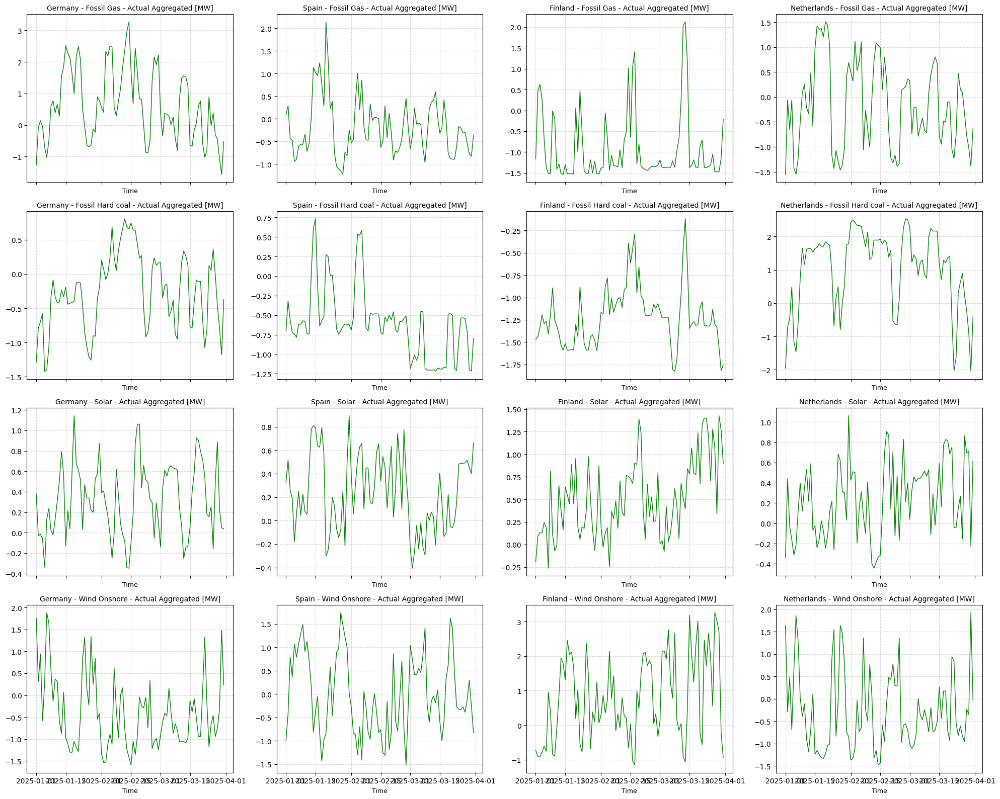

In [56]:
# Assume you have four DataFrames with the same structure:
dfs = [germany_daily_test_mean_normalized, spain_daily_test_mean_normalized, finland_daily_test_mean_normalized, netherlands_daily_test_mean_normalized]
df_names = ["Germany", "Spain", "Finland", "Netherlands"]

# List of features to plot
features = ["Fossil Gas - Actual Aggregated [MW]", "Fossil Hard coal - Actual Aggregated [MW]", "Solar - Actual Aggregated [MW]", "Wind Onshore - Actual Aggregated [MW]"]

# Determine the number of rows and columns for the grid
n_features = len(features)
n_countries = len(dfs)

fig, axes = plt.subplots(n_features, n_countries, figsize=(5 * n_countries, 4 * n_features), sharex=True)

# If there is only one row or one column, ensure axes is 2D
if n_features == 1:
    axes = np.expand_dims(axes, axis=0)
if n_countries == 1:
    axes = np.expand_dims(axes, axis=1)

# Loop over each country (column) and feature (row)
for col, (df, country) in enumerate(zip(dfs, df_names)):
    for row, feature in enumerate(features):
        ax = axes[row, col]
        # Plot the time series for the feature
        ax.plot(df.index, df[feature], label=country, color='g', lw=1)
        ax.set_title(f"{country} - {feature}", fontsize=10)
        ax.set_xlabel("Time", fontsize=9)

        ax.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

### **TIME FOR FORECASTING**

In [57]:
# Define countries, features, and forecast period
countries = ["Germany", "Spain", "Finland", "Netherlands"]
features = ["Fossil Gas - Actual Aggregated [MW]", "Fossil Hard coal - Actual Aggregated [MW]", "Solar - Actual Aggregated [MW]", "Wind Onshore - Actual Aggregated [MW]"]
forecast_months = ["January", "February", "March"]

# Store forecasts
all_forecasts = {}

# Loop through countries and features
for country in countries:
    all_forecasts[country] = {}
    for feature in features:
        # Get normalized time series data for the country and feature
        data = countries_data[country][feature]
        series = data.dropna()

        # Rolling forecast loop
        forecast_data = series.copy()
        forecasts = []
        for month in forecast_months:
            # Create and fit the SARIMA model
            model = SARIMAX(series, order=(1, 0, 1), seasonal_order=(1, 0, 1, 7), trend='ct', enforce_stationarity=False, enforce_invertibility=False)
            results = model.fit()

            # Forecast for the current month
            forecast_period = len(pd.date_range(start=f"{month} 1, {series.index[-1].year + 1}", periods=31, freq='D'))
            forecast = results.get_forecast(steps=forecast_period)
            forecast_values = forecast.predicted_mean

            # Add forecast to data for the next month's prediction
            forecast_index = pd.date_range(start=f"{month} 1, {series.index[-1].year + 1}", periods=len(forecast_values), freq='D')
            forecast_df = pd.Series(forecast_values.values, index=forecast_index)
            series = pd.concat([series, forecast_df])

            # Store forecast
            forecasts.extend(forecast_values)

        all_forecasts[country][feature] = forecasts

### **PLOTTING THE DATA FOR 2024 (TRAINING DATA), 2025 (TEST DATA), AND ALSO THE FORECAST FOR 2025.**


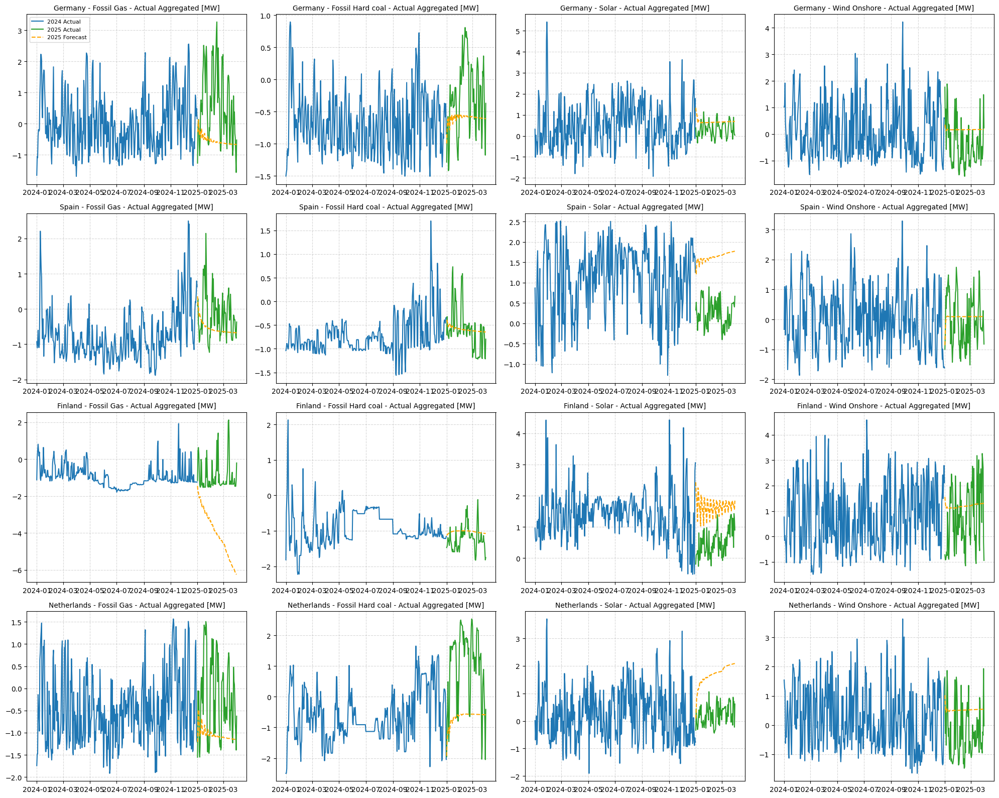

In [58]:
# Define countries, features, forecast months, and test datasets
countries = ["Germany", "Spain", "Finland", "Netherlands"]
features = ["Fossil Gas - Actual Aggregated [MW]", "Fossil Hard coal - Actual Aggregated [MW]", "Solar - Actual Aggregated [MW]", "Wind Onshore - Actual Aggregated [MW]"]
forecast_months = ["January", "February", "March"]
forecast_year = 2025

# Define corresponding test sets for 2025 actuals
test_data_map = {"Germany": germany_daily_test_mean_normalized, "Spain": spain_daily_test_mean_normalized, "Finland": finland_daily_test_mean_normalized, "Netherlands": netherlands_daily_test_mean_normalized}

# Store forecasts
all_forecasts = {}

for country in countries:
    all_forecasts[country] = {}
    for feature in features:
        full_series = countries_data[country][feature].dropna()
        train_series = full_series.copy()

        # Forecast loop
        forecasts = []
        for month in forecast_months:
            model = SARIMAX(train_series, order=(1, 0, 1), seasonal_order=(1, 0, 1, 7), trend='ct', enforce_stationarity=False, enforce_invertibility=False)
            results = model.fit(disp=False)

            forecast_period = len(pd.date_range(start=f"{month} 1, {forecast_year}", periods=31, freq='D'))
            forecast = results.get_forecast(steps=forecast_period)
            forecast_values = forecast.predicted_mean

            forecast_index = pd.date_range(start=f"{month} 1, {forecast_year}", periods=len(forecast_values), freq='D')
            forecast_df = pd.Series(forecast_values.values, index=forecast_index)
            train_series = pd.concat([train_series, forecast_df])
            forecasts.extend(forecast_values)

        all_forecasts[country][feature] = forecasts

# Plotting
num_cols = len(countries)
num_rows = len(features)
fig, axes = plt.subplots(num_rows, num_cols, figsize=(5 * num_cols, 4 * num_rows), sharex=False)
axes = np.array(axes).reshape(-1)
ax_index = 0

for country in countries:
    for feature in features:
        ax = axes[ax_index]

        # Get actual 2024
        full_series = countries_data[country][feature].dropna()
        actual_2024 = full_series[full_series.index.year == 2024]

        # Get actual Jan–Mar 2025
        test_series = test_data_map[country][feature].dropna()
        actual_2025 = test_series[test_series.index.month <= 3]

        # Forecasted values
        forecast_values = all_forecasts[country][feature]
        forecast_index = pd.date_range(start=f"January 1, {forecast_year}", periods=len(forecast_values), freq='D')
        forecast_index = forecast_index[forecast_index.month <= 3]
        forecast_values = forecast_values[:len(forecast_index)]
        forecast_series = pd.Series(forecast_values, index=forecast_index)

        # Plot each
        ax.plot(actual_2024.index, actual_2024.values, label="2024 Actual", color="#1f77b4")
        ax.plot(actual_2025.index, actual_2025.values, label="2025 Actual", color="#2ca02c")
        ax.plot(forecast_series.index, forecast_series.values, label="2025 Forecast", color="orange", linestyle='--')

        ax.set_title(f"{country} - {feature}", fontsize=10)
        ax.grid(True, linestyle='--', alpha=0.5)

        if ax_index == 0:
            ax.legend(fontsize=8)

        ax_index += 1

plt.tight_layout()
plt.show()

## **EVALUATION METRICS**

Now that we have forecasted using our fitted model, we need to check how well this model is able to forecast for the energy sources. So we used the root mean square error (RMSE), mean absolute error, and mean absolute scaled error.

1. RMSE- This measures the square root of the average of the squared differences between predicted and actual values.

2. MAE - This measures the average of the absolute differences between the predicted values and the actual values.

3. MASE- This is a scale independent error metric that compares your model’s performance to a naïve baseline model (usually the previous value).

In [59]:
# Metric functions
def compute_rmse(actual, predicted):
    return np.sqrt(mean_squared_error(actual, predicted))

def compute_mae(actual, predicted):
    return mean_absolute_error(actual, predicted)

def compute_mase(actual, predicted, training_series, seasonality=7):
    numerator = np.sum(np.abs(actual - predicted))
    denominator = np.sum(np.abs(training_series[seasonality:] - training_series[:-seasonality]))
    return numerator / (denominator + 1e-9)

# Load test data
dfs = [germany_daily_test_mean_normalized, spain_daily_test_mean_normalized, finland_daily_test_mean_normalized, netherlands_daily_test_mean_normalized]
df_names = countries

# Build test data dictionary
countries_data_test = {}
for df, name in zip(dfs, df_names):
    countries_data_test[name] = {}
    for feature in features:
        if feature in df.columns:
            ts = df[feature].dropna()
            ts.index = pd.to_datetime(ts.index)
            countries_data_test[name][feature] = ts

# Evaluate
evaluation_metrics = {}

for country in countries:
    evaluation_metrics[country] = {}
    for feature in features:
        try:
            # Get test and forecast
            test_series = countries_data_test[country][feature]
            test_series = test_series[
                (test_series.index.month >= 1) & (test_series.index.month <= 3)
            ][:90]

            forecast_values = all_forecasts[country][feature][:len(test_series)]
            forecast_series = pd.Series(forecast_values, index=test_series.index)

            # Get corresponding training series
            training_series = countries_data[country][feature].dropna()

            # Compute metrics
            rmse = compute_rmse(test_series, forecast_series)
            mae = compute_mae(test_series, forecast_series)
            mase = compute_mase(test_series, forecast_series, training_series)

            evaluation_metrics[country][feature] = {
                "RMSE": rmse,
                "MAE": mae,
                "MASE": mase
            }

        except Exception as e:
            print(f"Error evaluating {country} - {feature}: {e}")
            evaluation_metrics[country][feature] = {
                "RMSE": None, "MAE": None, "MASE": None
            }

# Display results
for country, features_data in evaluation_metrics.items():
    print(f"\nEvaluation Metrics for {country}:")
    for feature, metrics in features_data.items():
        print(f"  {feature}:")
        print(f"    RMSE: {metrics['RMSE']:.4f}" if metrics['RMSE'] is not None else "    RMSE: Error")
        print(f"    MAE:  {metrics['MAE']:.4f}" if metrics['MAE'] is not None else "    MAE: Error")
        print(f"    MASE: {metrics['MASE']:.4f}" if metrics['MASE'] is not None else "    MASE: Error")


Evaluation Metrics for Germany:
  Fossil Gas - Actual Aggregated [MW]:
    RMSE: 1.6484
    MAE:  1.3011
    MASE: 117097314706.2937
  Fossil Hard coal - Actual Aggregated [MW]:
    RMSE: 0.6297
    MAE:  0.5229
    MASE: 47060045481.9850
  Solar - Actual Aggregated [MW]:
    RMSE: 0.5213
    MAE:  0.4234
    MASE: 38102517243.1109
  Wind Onshore - Actual Aggregated [MW]:
    RMSE: 0.9887
    MAE:  0.8582
    MASE: 77235225674.6189

Evaluation Metrics for Spain:
  Fossil Gas - Actual Aggregated [MW]:
    RMSE: 0.7403
    MAE:  0.5607
    MASE: 50463825088.3741
  Fossil Hard coal - Actual Aggregated [MW]:
    RMSE: 0.4312
    MAE:  0.3121
    MASE: 28088585742.7444
  Solar - Actual Aggregated [MW]:
    RMSE: 1.4305
    MAE:  1.3881
    MASE: 124931789589.7101
  Wind Onshore - Actual Aggregated [MW]:
    RMSE: 0.8158
    MAE:  0.6947
    MASE: 62524686557.2252

Evaluation Metrics for Finland:
  Fossil Gas - Actual Aggregated [MW]:
    RMSE: 3.4816
    MAE:  3.1401
    MASE: 282605858184